In [2]:
import os 
import progressbar
import numpy as np
import statsmodels.stats.api as sms
import matplotlib.pyplot as plt
import seaborn as sns

from utils import aggregateParams, get_params_final_function
from plot import errorbar_plot, calc_means_and_stds

# formatting for plots
sns.set()
sns.set_context("paper", rc={"font.size":20,"axes.titlesize":20,
                             "axes.labelsize":20, 'xtick.labelsize': 14,
                             'ytick.labelsize': 14, "legendsize": 14})

# names of parameters in final function
statsNames = ["Number of different variables", "Number of different variables ratio", "Diff variables / Total variables", 
              "Number of variables", 
              "Proportion of variables", "Number of add nodes", "Number of add nodes ratio", "Number of mul. nodes", 
              "Number of mul. nodes ratio", "Number of div. nodes",  "Number of div. nodes ratio",
              "Number of constants", "Proportion of Constants", "Min. constant", "Max. constant", "Mean constants",
             "Std. constants", "Number of weights", "Min. weight", "Max. weight", "Mean weights", "Std. weights"]

# Analyze Final Function

## Simple GP Backprop Gridsearch

##### 10-fold cross val, max time 20 seconds, optimal simple GP params

### Best params 

In [3]:
all_results, all_params_to_mse, all_mse_to_params, all_mse = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", allStats = False, printNum = 5)

100% (30720 of 30720) |##################| Elapsed Time: 0:00:12 Time:  0:00:12


Result 0: maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr0.1_it15_oIt15_initial1_firstGen5 with mean test MSE 4070.6594 - std test MSE 1106.1243122298888
Result 1: maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr0.1_it10_oIt10_initial1_firstGen9223372036854775807 with mean test MSE 4071.4549 - std test MSE 1181.2169168549535
Result 2: maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK0.1_gen1_lr0.001_it5_oIt5_initial0_firstGen9223372036854775807 with mean test MSE 4191.1468 - std test MSE 1200.582888023869
Result 3: maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK0.5_gen1_lr0.001_it10_oIt10_initial1_firstGen9223372036854775807 with mean test MSE 4234.5211 - std test MSE 1318.184291802128
Result 4: maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK0.75_gen2_lr0.1_it10_oIt10_initial1_firstGen5 with mean test MSE 4272.8331 - std test MSE 1111.6150825309642


### Best params: Holding all other parameters constant, explore the impact of changing one parameter

In [2]:
from plot import calc_means_and_stds, errorbar_plot

#### Variation with population ratio

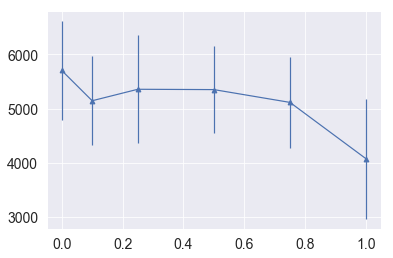

In [6]:
template_popRatio = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK{}_gen2_lr0.1_it15_oIt15_initial1_firstGen5"
u = [0, 0.1, 0.25, 0.5, 0.75, 1]
errorbar_plot(calc_means_and_stds(template_popRatio, u, all_params_to_mse))

#### Variation with "Every how many generations"

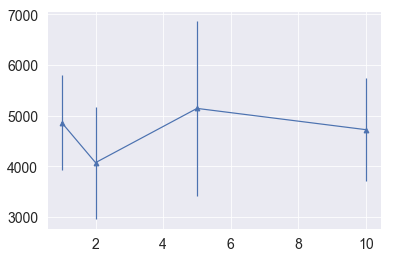

In [7]:
template_gen = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen{}_lr0.1_it15_oIt15_initial1_firstGen5"
gen = [1, 2, 5, 10]
errorbar_plot(calc_means_and_stds(template_gen, gen, all_params_to_mse))

#### Vatiation with learning rate

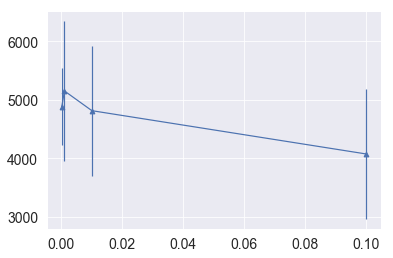

In [8]:
template_lr = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr{}_it15_oIt15_initial1_firstGen5"
lr = [0.1, 0.01, 0.001, 0.0001]
errorbar_plot(calc_means_and_stds(template_lr, lr, all_params_to_mse))

#### Variation with number of backprop iterations

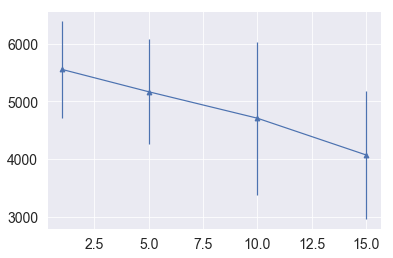

In [9]:
template_it = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr0.1_it{}_oIt{}_initial1_firstGen5"
it = [1, 5, 10, 15]
errorbar_plot(calc_means_and_stds(template_it, it, all_params_to_mse, two = True))

#### Variation: whether to perform backprop on initial population

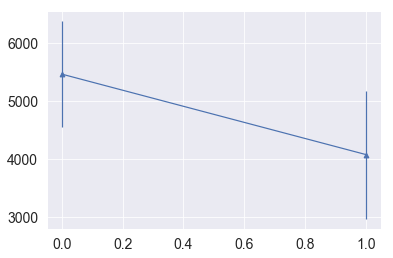

In [10]:
template_initia = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr0.1_it15_oIt15_initial{}_firstGen5"
initia = [0, 1]
errorbar_plot(calc_means_and_stds(template_initia, initia, all_params_to_mse))

#### Variation: Number of first generations to apply backprop to

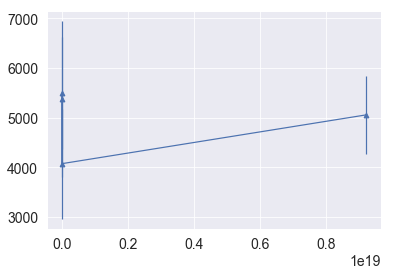

In [11]:
template_firstGen = "maxtime20_pop512_mr0.001_tour8_maxHeight2_cr1__topK1_unK1_gen2_lr0.1_it15_oIt15_initial1_firstGen{}"
firstGen = [1, 3, 5, 9223372036854775807]
errorbar_plot(calc_means_and_stds(template_firstGen, firstGen, all_params_to_mse))

In [4]:
# Compute statistics (train MSE, test MSE, number of generations, tree size, overfitting, train MSE of initial population,
#   final function)

all_files, stats, params_to_stats = get_params_final_function("../experiments_backprop_gridsearch_offspringOnly/") # get final function stats
_, train_mse_agg_sig, _, _, _, train_mse = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", valType = "train_mse", allStats = True, printNum = 0)
_, tree_size_agg_sig, _, _, _, tree_size = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", valType = "tree_size", allStats = True, printNum = 0)
_, numGen_agg_sig, _, _, _, numGen = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", valType = "numGen", allStats = True, printNum = 0)
_, test_mse_agg_sig, _, _, _, test_mse = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", allStats = True, printNum = 0)
_, diff_mse_agg_sig, _, _, _, diff_mse = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", valType = "diff_mse", allStats = True, printNum = 0)
_, gen0_mse_agg_sig, _, _, _, gen0_mse = aggregateParams("../experiments_backprop_gridsearch_offspringOnly/", valType = "gen0_train_mse", allStats = True, printNum = 0)

tree_size_agg = [np.mean(tree_size_agg_sig[i]) for i in tree_size_agg_sig]
test_mse_agg = [np.mean(test_mse_agg_sig[i]) for i in test_mse_agg_sig]
numGen_agg = [np.mean(numGen_agg_sig[i]) for i in numGen_agg_sig]
train_mse_agg = [np.mean(train_mse_agg_sig[i]) for i in train_mse_agg_sig]
diff_mse_agg = [np.mean(diff_mse_agg_sig[i]) for i in diff_mse_agg_sig]
gen0_mse_agg = [np.mean(gen0_mse_agg_sig[i]) for i in gen0_mse_agg_sig]
stats_agg = [[np.mean([params_to_stats[i][j][k] for j in range(len(params_to_stats[i]))]) for k in range(len(params_to_stats[i][0]))] for i in params_to_stats]

100% (30720 of 30720) |##################| Elapsed Time: 0:00:32 Time:  0:00:32
100% (30720 of 30720) |##################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (30720 of 30720) |##################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (30720 of 30720) |##################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (30720 of 30720) |##################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (30720 of 30720) |##################| Elapsed Time: 0:00:06 Time:  0:00:06
100% (30720 of 30720) |##################| Elapsed Time: 0:00:11 Time:  0:00:11


### Correlations without final function

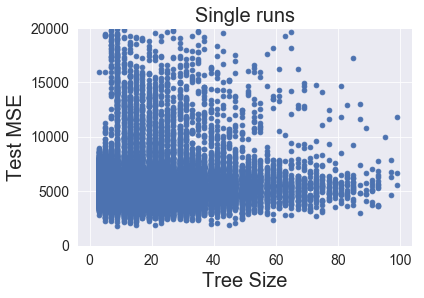

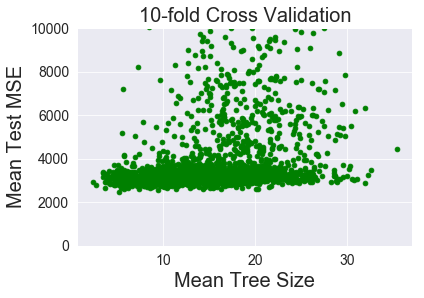

In [13]:
plt.scatter(tree_size, test_mse)
axes = plt.gca()
axes.set_ylim(bottom=0, top = 20000)
plt.title("Single runs")
axes.set_xlabel("Tree Size", size = 20)
axes.set_ylabel("Test MSE", size = 20)
plt.show()
# -> >-shape: lower Test MSE but also higher variance for small trees

plt.scatter(tree_size_agg, test_mse_agg, color = "green")
lb = [sms.DescrStatsW(test_mse_agg_sig[i]).tconfint_mean()[0] for i in test_mse_agg_sig]
ub = [sms.DescrStatsW(test_mse_agg_sig[i]).tconfint_mean()[1] for i in test_mse_agg_sig]
axes = plt.gca()
axes.set_ylim(bottom=0, top = 10000)
plt.title("10-fold Cross Validation")
axes.set_xlabel("Mean Tree Size", size = 20)
axes.set_ylabel("Mean Test MSE", size = 20)
plt.show()
# -> no pattern

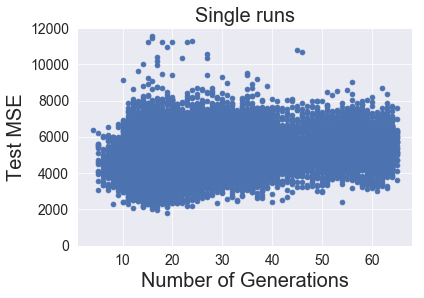

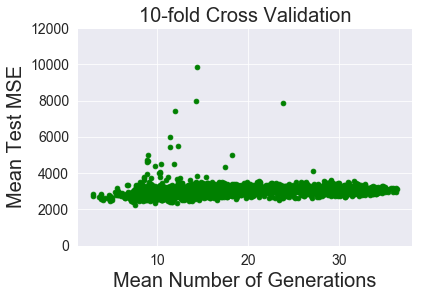

In [14]:
plt.scatter(numGen, test_mse)
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
axes.set_xlabel("Number of Generations", size = 20)
axes.set_ylabel("Test MSE", size = 20)
plt.title("Single runs")
plt.show()
plt.scatter(numGen_agg, test_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
plt.title("10-fold Cross Validation")
axes.set_xlabel("Mean Number of Generations", size = 20)
axes.set_ylabel("Mean Test MSE", size = 20)
plt.show()

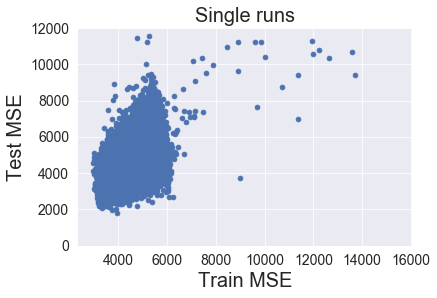

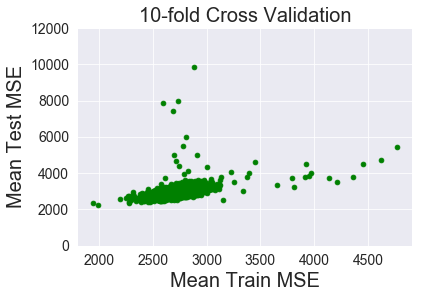

In [15]:
plt.scatter(train_mse, test_mse)
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
plt.title("Single runs")
axes.set_xlabel("Train MSE", size = 20)
axes.set_ylabel("Test MSE", size = 20)
plt.show()
plt.scatter(train_mse_agg, test_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
axes.set_xlabel("Mean Train MSE", size = 20)
axes.set_ylabel("Mean Test MSE", size = 20)
plt.title("10-fold Cross Validation")
plt.show()
# -> lower mean train MSE means lower mean test MSE

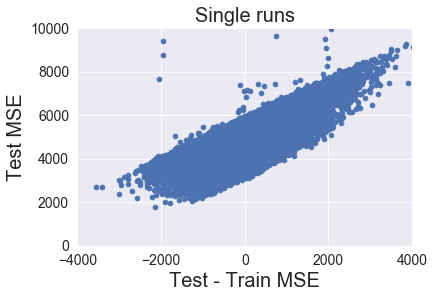

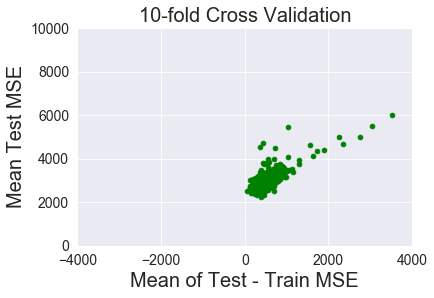

In [16]:
plt.scatter(diff_mse, test_mse)
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlim(left = -4000, right = 4000)
axes.set_xlabel("Test - Train MSE", size = 20)
axes.set_ylabel("Test MSE", size = 20)
plt.title("Single runs")
plt.show()
plt.scatter(diff_mse_agg, test_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlim(left = -4000, right = 4000)
axes.set_xlabel("Mean of Test - Train MSE", size = 20)
axes.set_ylabel("Mean Test MSE", size = 20)
plt.title("10-fold Cross Validation")
plt.show()
# -> positive correlation: less overfitting means smaller mean test MSE

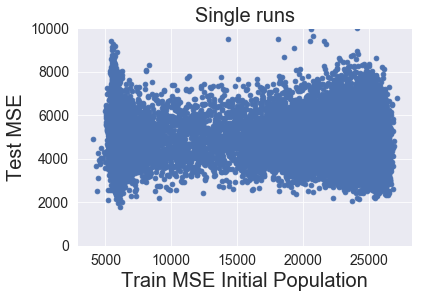

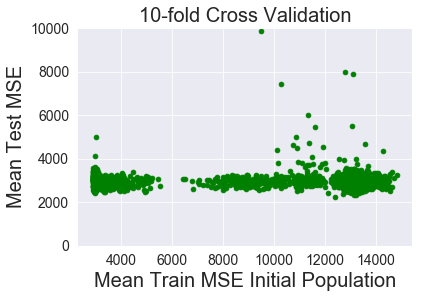

In [6]:
plt.scatter(gen0_mse, test_mse)
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlabel("Train MSE Initial Population", size = 20)
axes.set_ylabel("Test MSE", size = 20)
plt.title("Single runs")
plt.show()

plt.scatter(gen0_mse_agg, test_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlabel("Mean Train MSE Initial Population", size = 20)
axes.set_ylabel("Mean Test MSE", size = 20)
plt.title("10-fold Cross Validation")
plt.show()

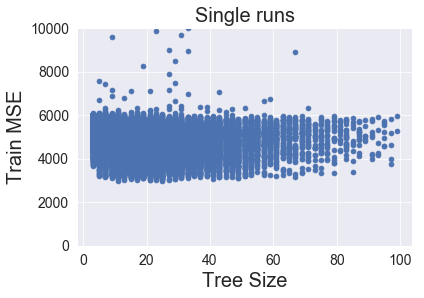

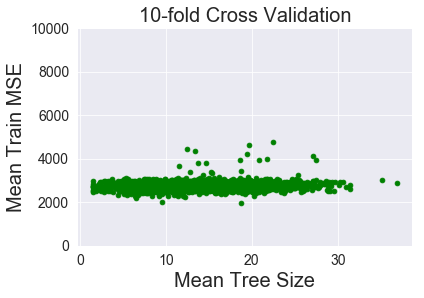

In [17]:
plt.scatter(tree_size, train_mse)
axes = plt.gca()
axes.set_ylim(bottom=0, top = 10000)
axes.set_xlabel("Tree Size", size = 20)
axes.set_ylabel("Train MSE", size = 20)
plt.title("Single runs")
plt.show()

plt.scatter(tree_size_agg, train_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom=0, top = 10000)
axes.set_xlabel("Mean Tree Size", size = 20)
axes.set_ylabel("Mean Train MSE", size = 20)
plt.title("10-fold Cross Validation")
plt.show()

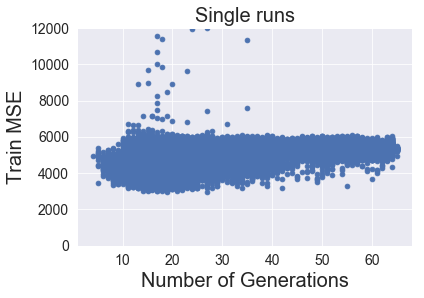

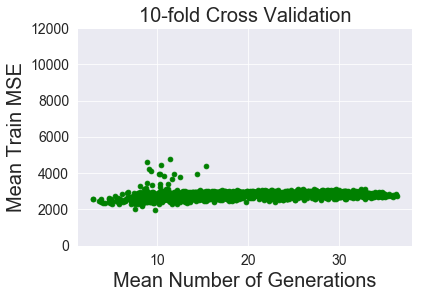

In [18]:
plt.scatter(numGen, train_mse)
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
axes.set_xlabel("Number of Generations", size = 20)
axes.set_ylabel("Train MSE", size = 20)
plt.title("Single runs")
plt.show()
# -> lower number of generations means lower mean train MSE
plt.scatter(numGen_agg, train_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom=0, top = 12000)
axes.set_xlabel("Mean Number of Generations", size = 20)
axes.set_ylabel("Mean Train MSE", size = 20)
plt.title("10-fold Cross Validation")
plt.show()
# -> lower mean number of generations means lower mean train MSE (slightly: probably: lower generations mean more backprop)

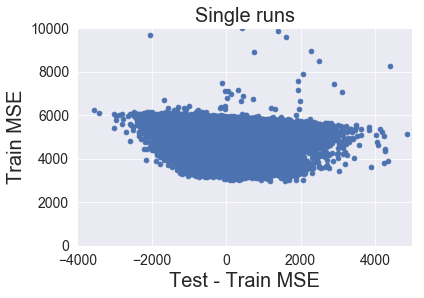

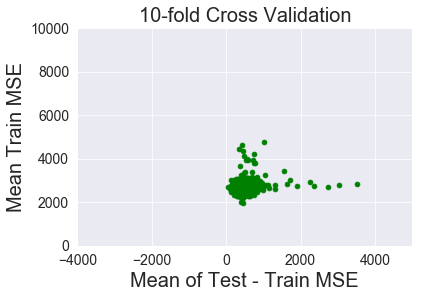

In [19]:
plt.scatter(diff_mse, train_mse)
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlim(left = -4000, right = 5000)
axes.set_xlabel("Test - Train MSE", size = 20)
plt.title("Single runs")
axes.set_ylabel("Train MSE", size = 20)
plt.show()
plt.scatter(diff_mse_agg, train_mse_agg, color = "green")
axes = plt.gca()
axes.set_ylim(bottom = 0, top = 10000)
axes.set_xlim(left = -4000, right = 5000)
axes.set_xlabel("Mean of Test - Train MSE", size = 20)
plt.title("10-fold Cross Validation")
axes.set_ylabel("Mean Train MSE", size = 20)
plt.show()
# -> all settings lead to very similar mean train MSEs

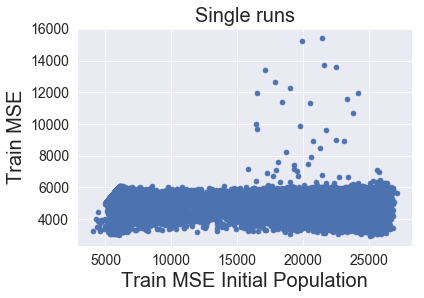

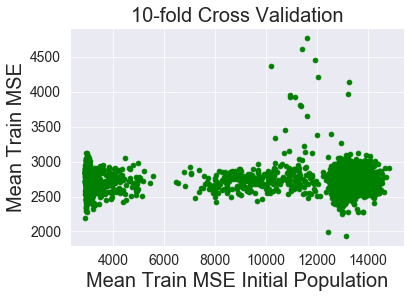

In [10]:
plt.scatter(gen0_mse, train_mse)
axes = plt.gca()
axes.set_xlabel("Train MSE Initial Population", size = 20)
plt.title("Single runs")
axes.set_ylabel("Train MSE", size = 20)
plt.show()
plt.scatter(gen0_mse_agg, train_mse_agg, color = "green")
axes = plt.gca()
axes.set_xlabel("Mean Train MSE Initial Population", size = 20)
plt.title("10-fold Cross Validation")
axes.set_ylabel("Mean Train MSE", size = 20)
plt.show()

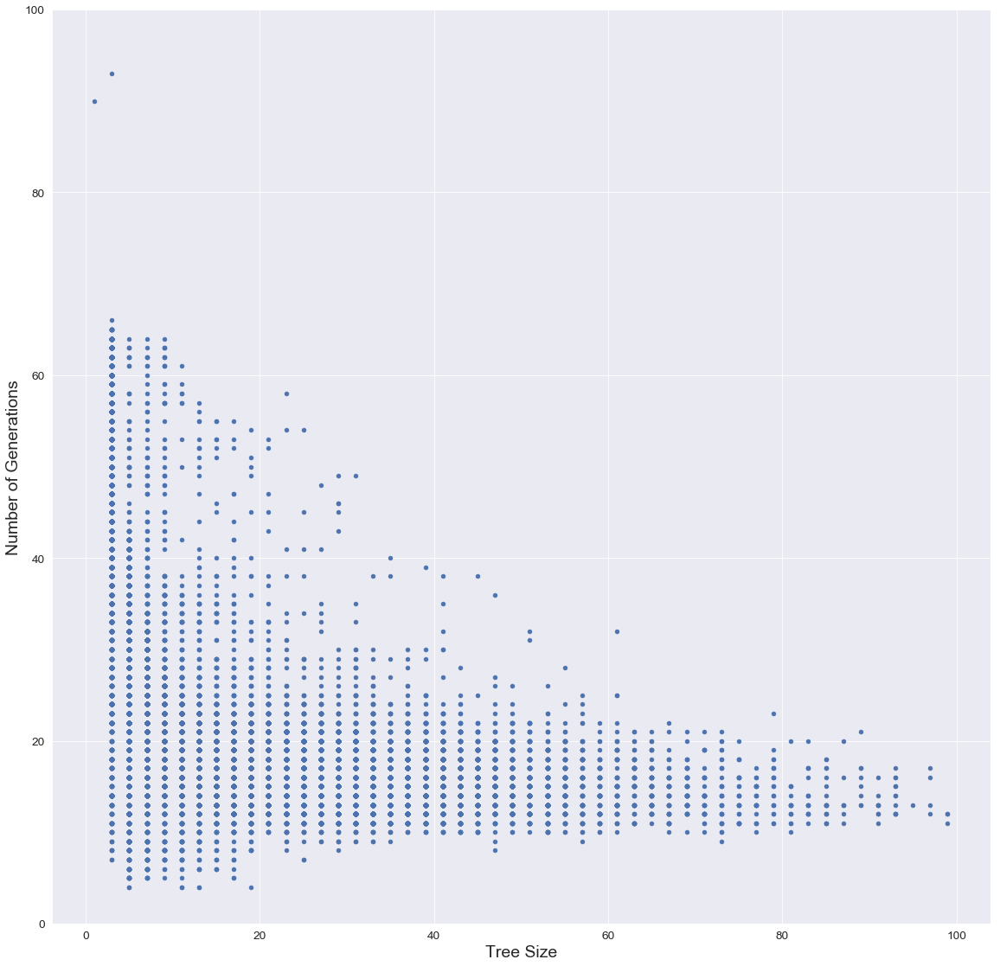

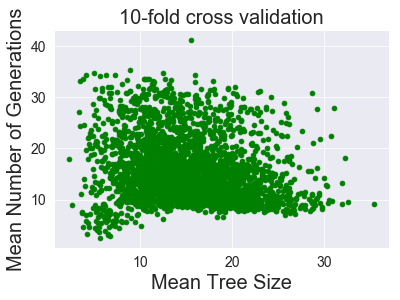

In [100]:
fig = plt.figure(num=None, figsize=(20, 20), dpi=70, facecolor='w', edgecolor='k')
plt.scatter(tree_size, numGen)
axes = plt.gca()
#plt.title("Single runs")
axes.set_xlabel("Tree Size", size = 20)
axes.set_ylim(bottom = 0, top = 100)
axes.set_ylabel("Number of Generations", size = 20)
plt.savefig("TreeSize_NumGen.jpg")
plt.show()

# -> smaller trees -> more and also fewer generations: >-shape
plt.scatter(tree_size_agg, numGen_agg, color = "green")
axes = plt.gca()
plt.title("10-fold cross validation")
axes.set_xlabel("Mean Tree Size", size = 20)
axes.set_ylabel("Mean Number of Generations", size = 20)
plt.show()

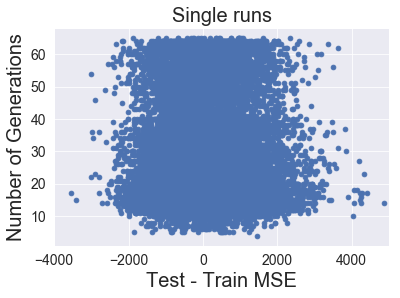

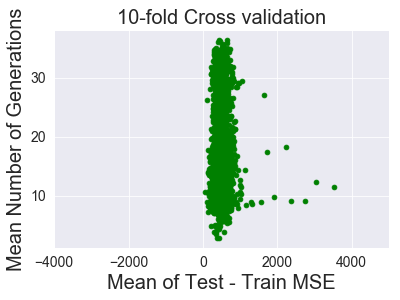

In [23]:
plt.scatter(diff_mse, numGen)
axes = plt.gca()
plt.title("Single runs")
axes.set_xlim(left = -4000, right = 5000)
axes.set_xlabel("Test - Train MSE", size = 20)
axes.set_ylabel("Number of Generations", size = 20)
plt.show()
plt.scatter(diff_mse_agg, numGen_agg, color = "green")
axes = plt.gca()
plt.title("10-fold Cross validation")
axes.set_xlim(left = -4000, right = 5000)
axes.set_xlabel("Mean of Test - Train MSE", size = 20)
axes.set_ylabel("Mean Number of Generations", size = 20)
plt.show()

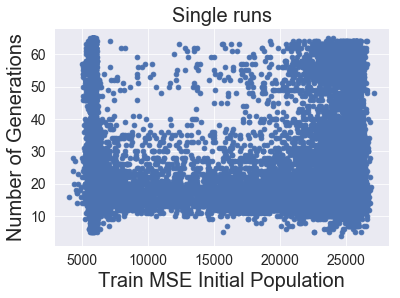

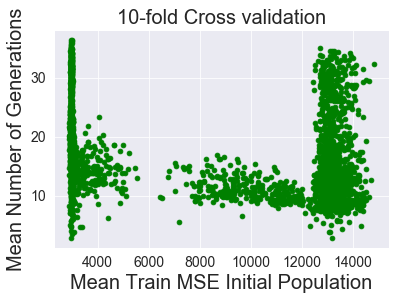

In [12]:
plt.scatter(gen0_mse, numGen)
axes = plt.gca()
plt.title("Single runs")
axes.set_xlabel("Train MSE Initial Population", size = 20)
axes.set_ylabel("Number of Generations", size = 20)
plt.show()
plt.scatter(gen0_mse_agg, numGen_agg, color = "green")
axes = plt.gca()
plt.title("10-fold Cross validation")
axes.set_xlabel("Mean Train MSE Initial Population", size = 20)
axes.set_ylabel("Mean Number of Generations", size = 20)
plt.show()

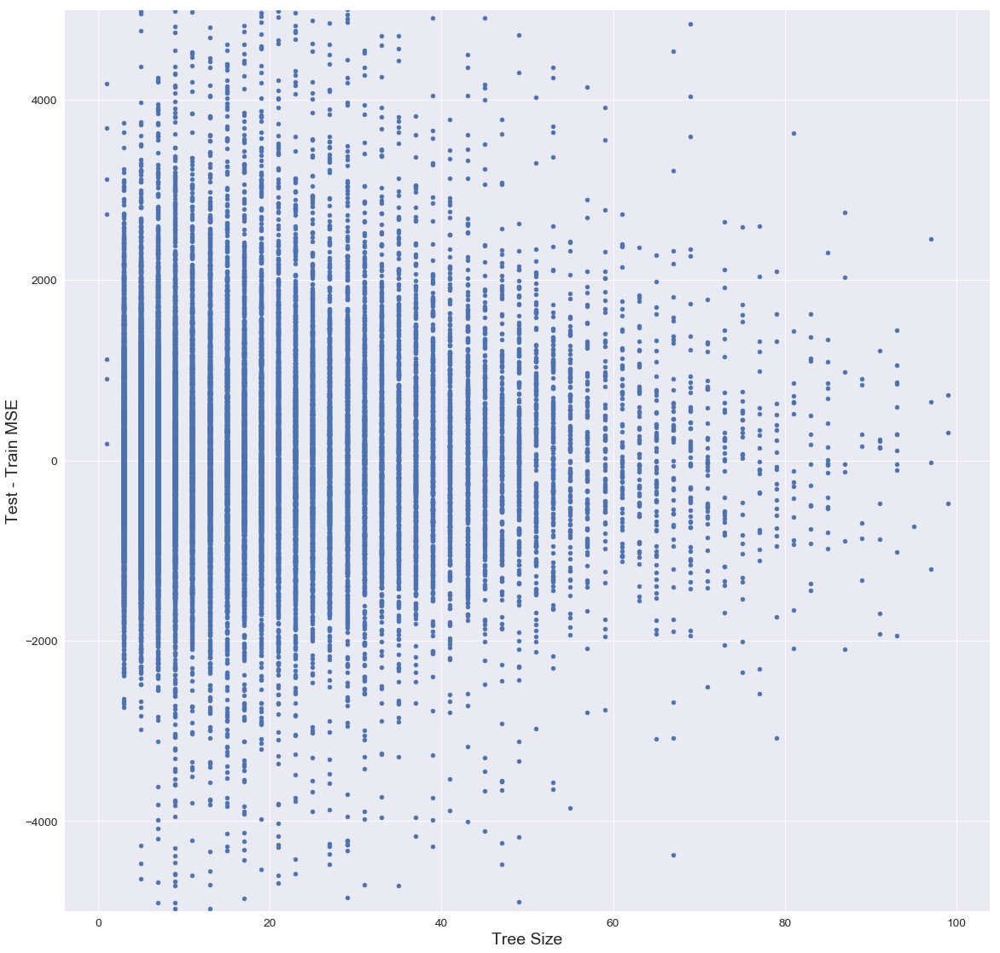

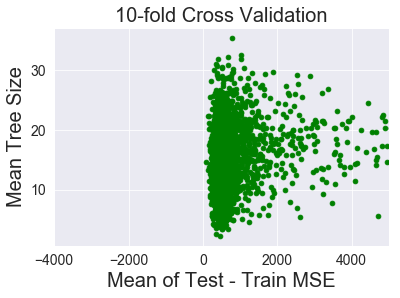

In [120]:
fig = plt.figure(num=None, figsize=(20, 20), dpi=70, facecolor='w', edgecolor='k')
plt.scatter(tree_size, diff_mse)
axes = plt.gca()
#plt.title("Single runs")
axes.set_ylim(bottom = -5000, top = 5000)
axes.set_ylabel("Test - Train MSE", size = 20)
axes.set_xlabel("Tree Size", size = 20)
fig.savefig("overfitting_treesize.jpg")
plt.show()
plt.scatter(diff_mse_agg, tree_size_agg, color = "green")
axes = plt.gca()
plt.title("10-fold Cross Validation")
axes.set_xlim(left = -4000, right = 5000)
axes.set_xlabel("Mean of Test - Train MSE", size = 20)
axes.set_ylabel("Mean Tree Size", size = 20)
plt.show()

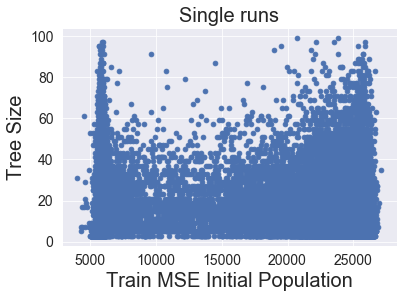

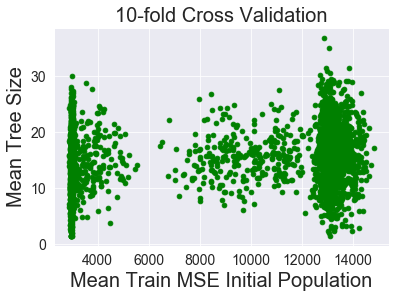

In [13]:
plt.scatter(gen0_mse, tree_size)
axes = plt.gca()
plt.title("Single runs")
axes.set_xlabel("Train MSE Initial Population", size = 20)
axes.set_ylabel("Tree Size", size = 20)
plt.show()

plt.scatter(gen0_mse_agg, tree_size_agg, color = "green")
axes = plt.gca()
plt.title("10-fold Cross Validation")
axes.set_xlabel("Mean Train MSE Initial Population", size = 20)
axes.set_ylabel("Mean Tree Size", size = 20)
plt.show()

### Correlations overall test MSE - final function

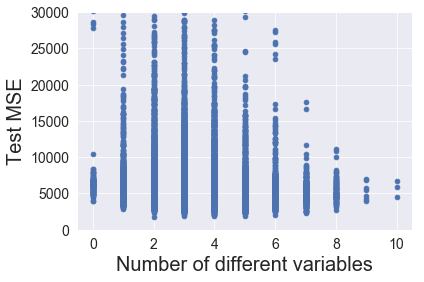

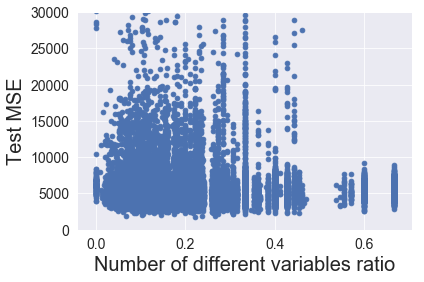

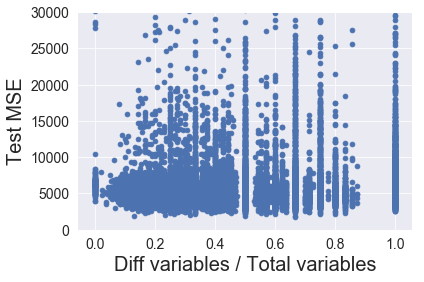

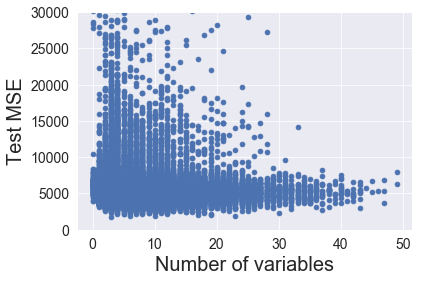

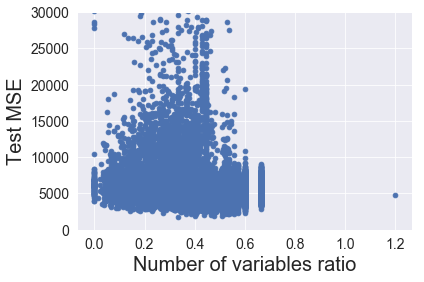

...

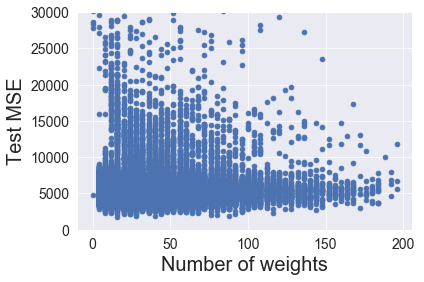

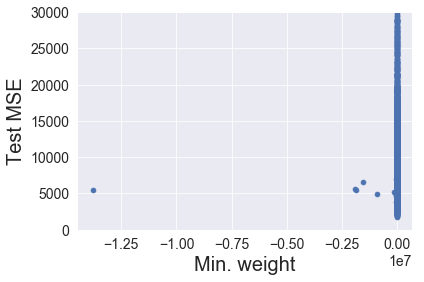

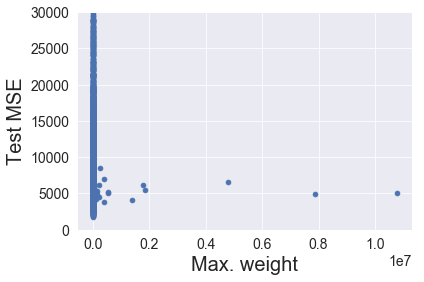

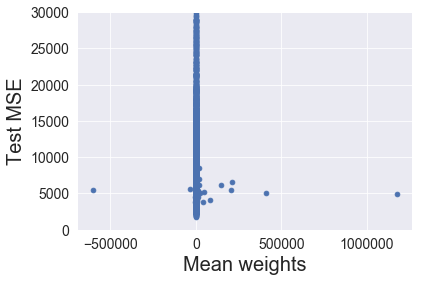

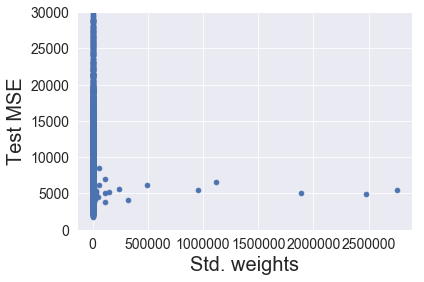

In [40]:
for i in range(len(stats[0])):
    signal = [s[i] for s in stats]
    plt.scatter(signal, test_mse)
    axes = plt.gca()
    axes.set_ylim(bottom=0, top = 30000)
    axes.set_xlabel(statsNames[i], size = 20)
    #axes.set_xlim(left = -100, right = 100) # to look at weights
    axes.set_ylabel("Test MSE", size = 20)
    plt.show()
# -> >-shapes: add nodes ratio, std weights
# -> <-shapes: variables ratio
# -> >=-shape: std constants
# -> <=-shape: /
# -> pos correlation: /
# -> neg. correlation: /
# -> lowest test MSE for mean weight of 0

### Correlations overall (aggregated across cross-val): test MSE - final function

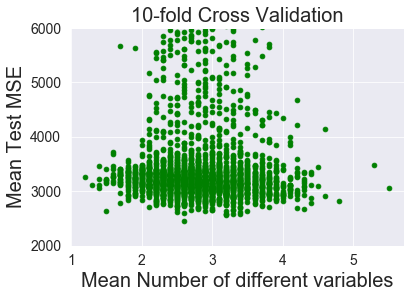

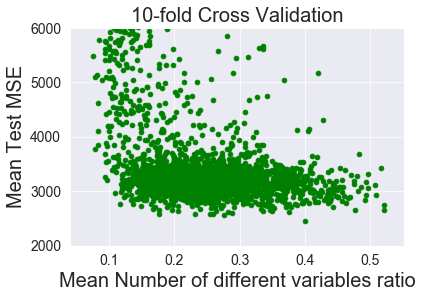

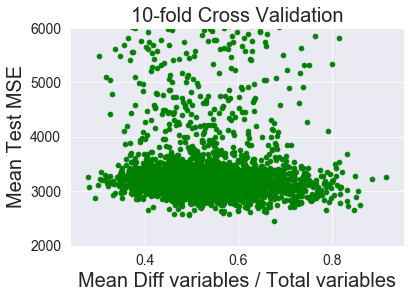

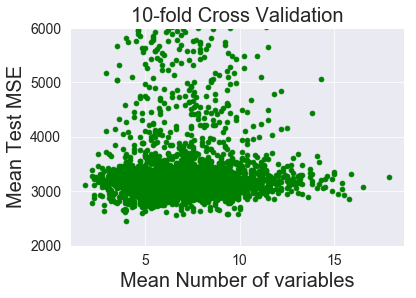

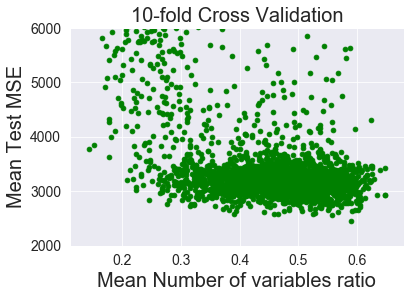

...

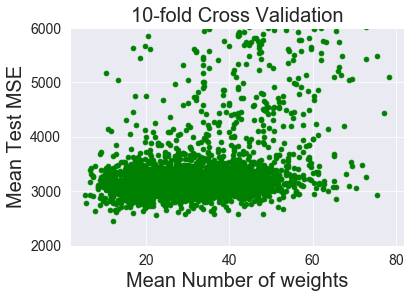

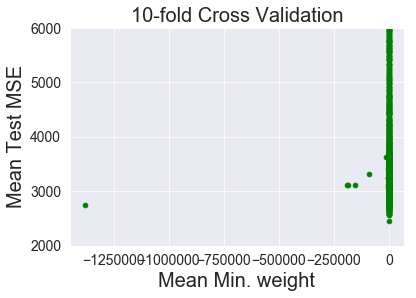

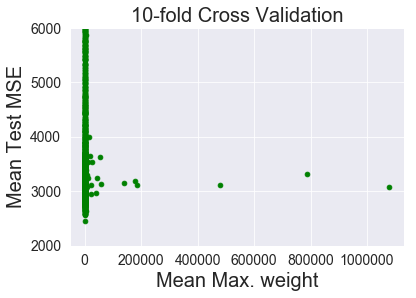

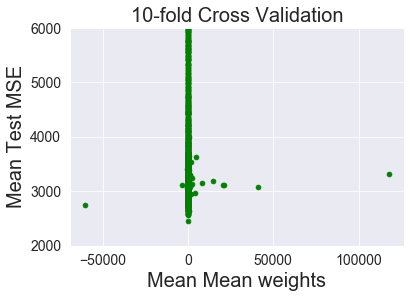

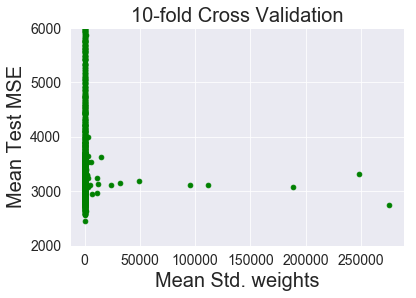

In [33]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, test_mse_agg, color = "green")
    axes = plt.gca()
    plt.title("10-fold Cross Validation")
    axes.set_ylim(bottom=2000, top = 6000)
    #axes.set_xlim(left = -100, right = 100) # to look at weights
    axes.set_xlabel("Mean " + statsNames[i], size = 20)
    axes.set_ylabel("Mean Test MSE", size = 20)
    plt.show()
# -> >-shapes: add nodes ratio, div nodes ratio, number of constants ratio, min constant, max constant, mean constants,
#                   std constants
# -> <-shapes: /
# -> >=-shape: /
# -> <=-shape: /
# -> pos correlation: /
# -> neg. correlation: /

### Correlations overall number of generations - final function

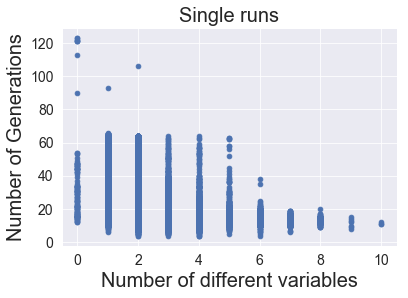

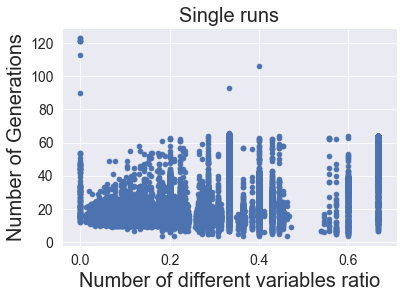

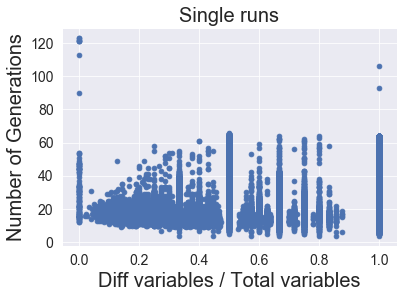

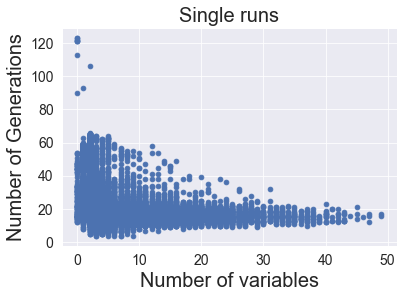

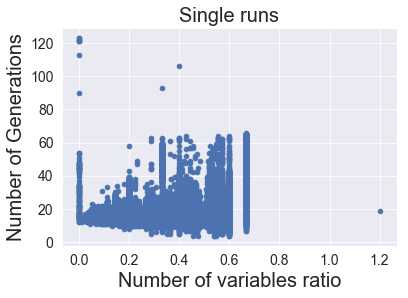

...

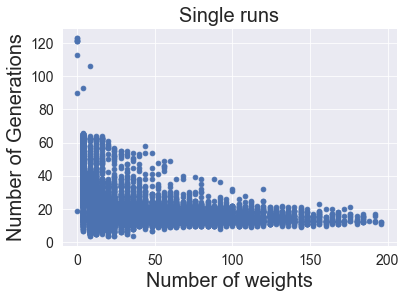

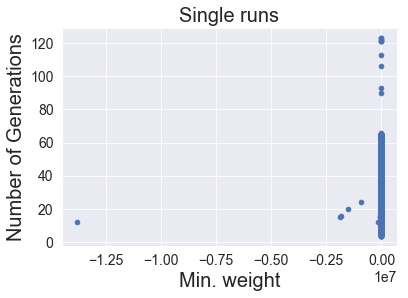

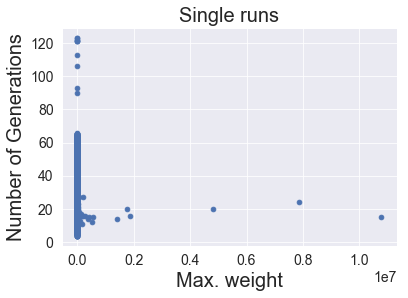

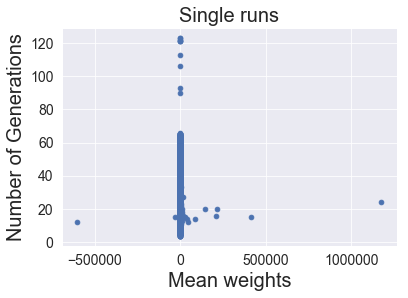

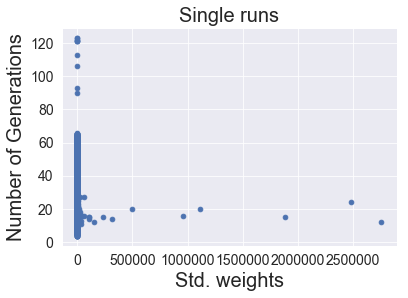

In [29]:
for i in range(len(stats[0])):
    signal = [s[i] for s in stats]
    plt.scatter(signal, numGen)
    axes = plt.gca()
    plt.title("Single runs")
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Number of Generations", size = 20)
    plt.show()
# -> >-shapes: add nodes ratio
# -> <-shapes: variables ratio
# -> >=-shape: /
# -> <=-shape: different variables ratio, diff variables / total variables
# -> pos correlation: /
# -> neg. correlation: /

### Correlations overall (aggregated across cross-val): Number of generations - final function

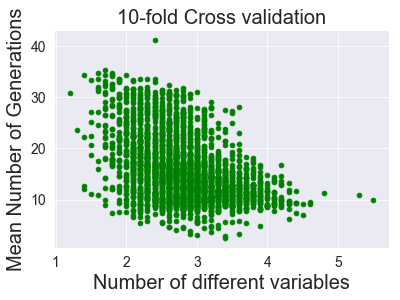

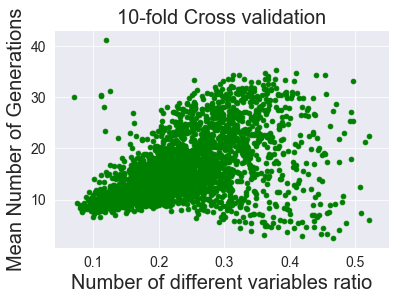

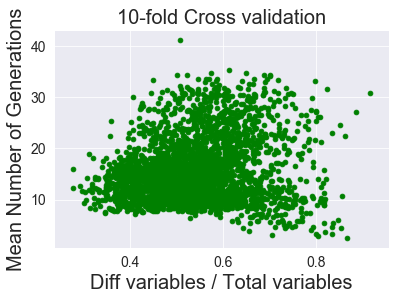

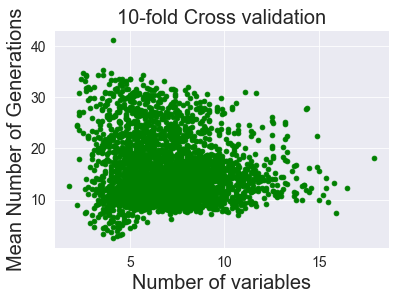

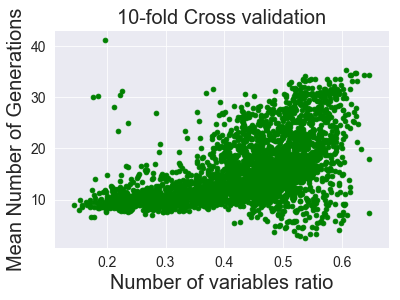

...

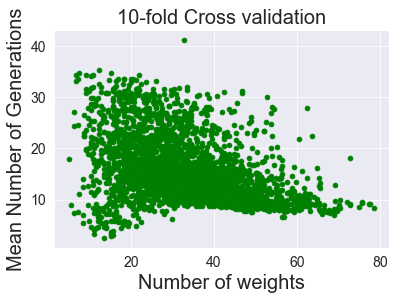

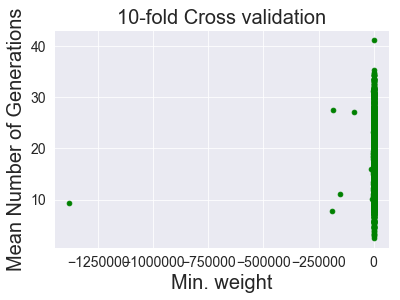

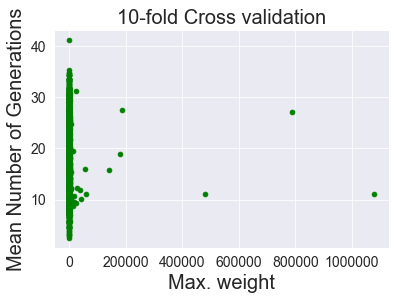

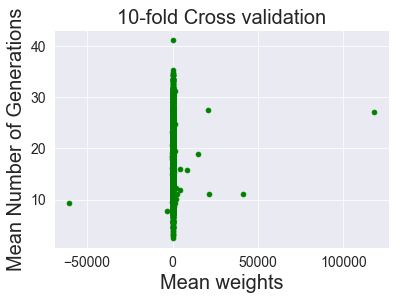

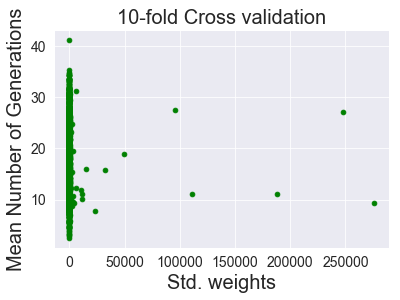

In [28]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, numGen_agg, color = "green")
    axes = plt.gca()
    plt.title("10-fold Cross validation")
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Mean Number of Generations", size = 20)
    plt.show()
# -> >-shapes: constants ratio, min constant, max constant, mean constants, std constants
# -> <-shapes: /
# -> >=-shape: /
# -> <=-shape: variables ratio, 
# -> pos correlation: different variables ratio, 
# -> neg. correlation: /

### Correlations overall: tree size - final function

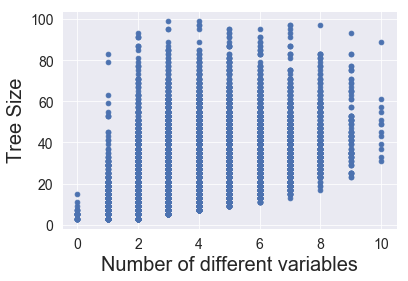

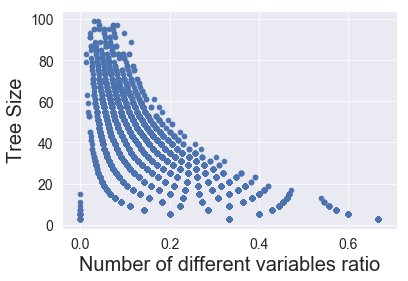

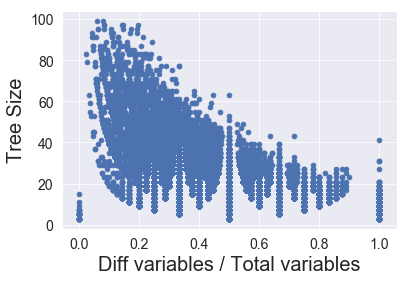

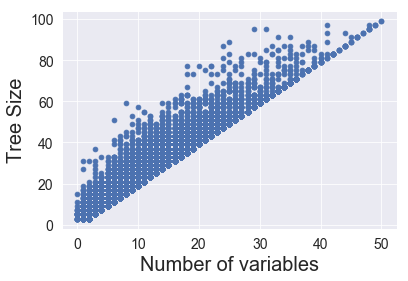

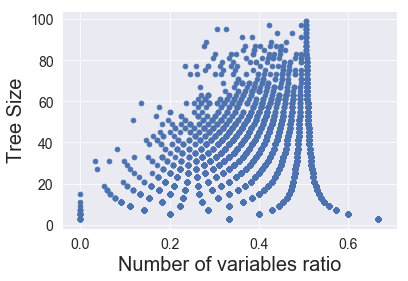

...

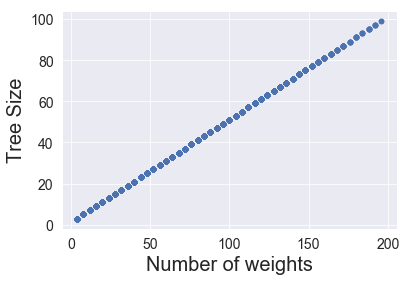

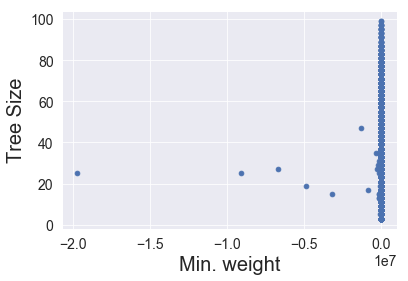

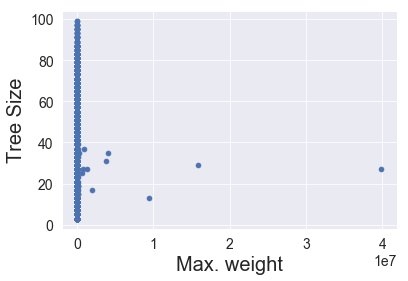

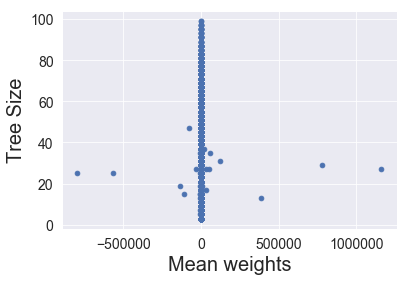

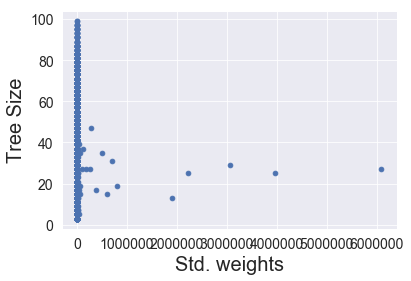

In [9]:
for i in range(len(stats[0])):
    signal = [s[i] for s in stats]
    plt.scatter(signal, tree_size)
    axes = plt.gca()
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Tree Size", size = 20)
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: different variables ratio, diff variables/total variables, add nodes ratio, constants ratio
# -> <=-shape: number of variables ratio

### Correlations overall (aggregated across cross-val): tree size - final function

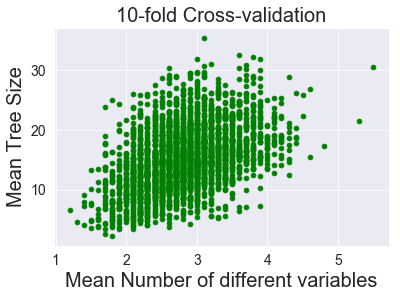

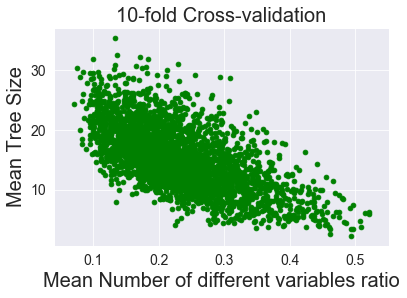

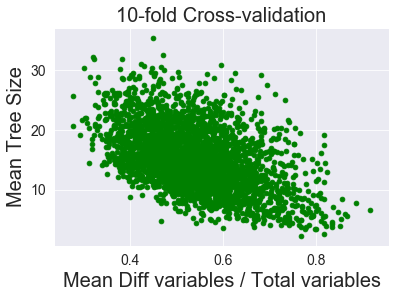

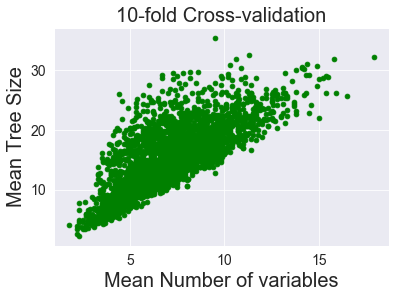

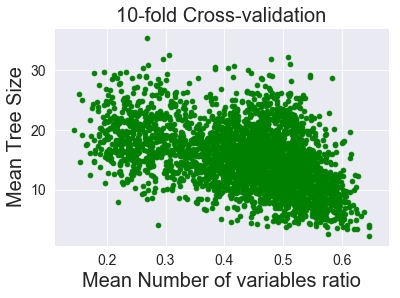

...

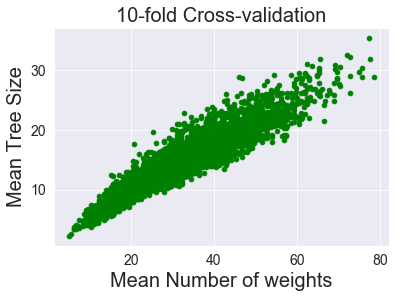

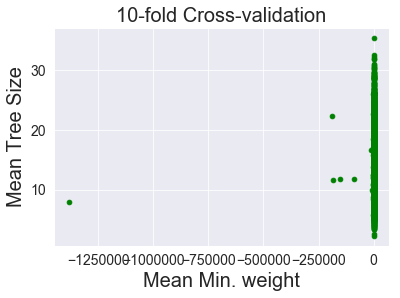

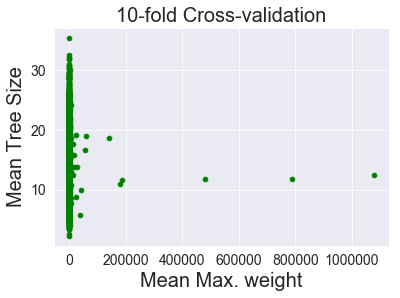

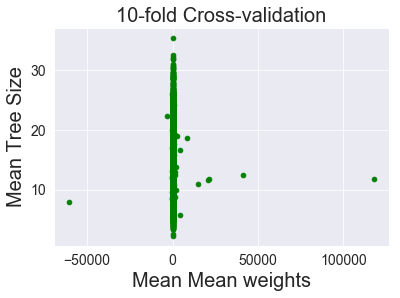

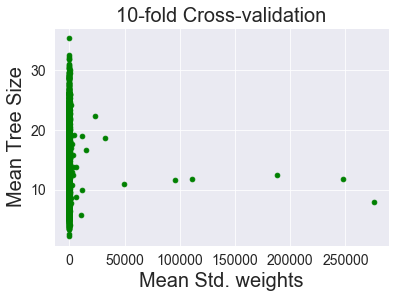

In [17]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, tree_size_agg, color = "green")
    plt.title("10-fold Cross-validation")
    axes = plt.gca()
    axes.set_xlabel("Mean " + statsNames[i], size = 20)
    axes.set_ylabel("Mean Tree Size", size = 20)
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: /
# -> <=-shape: /
# -> pos correlation: mean constants
# -> neg. correlation: different variables ratio, different variables/total variables, variables ratio

### Correlations overall: test mse - train mse (overfitting) - final function

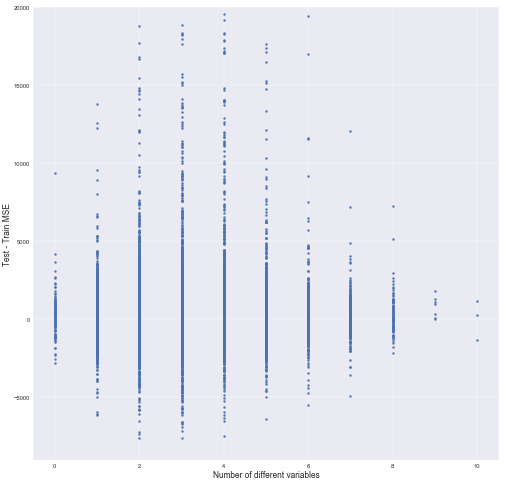

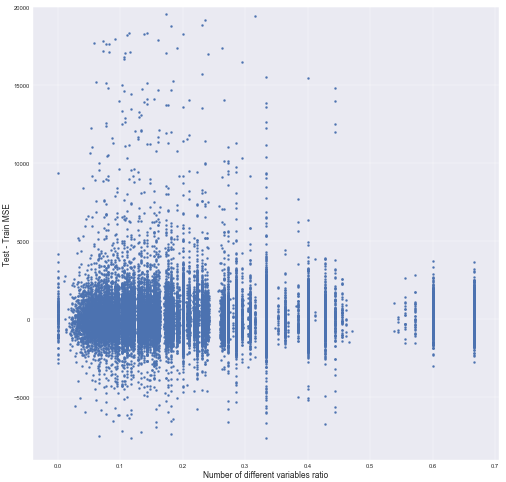

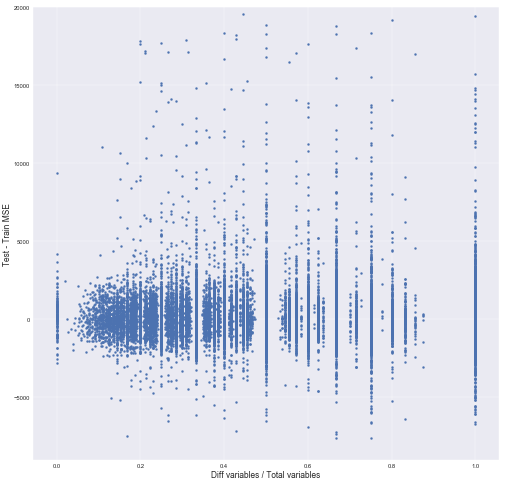

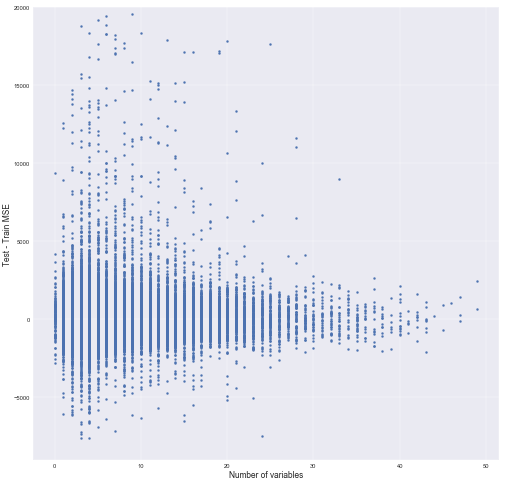

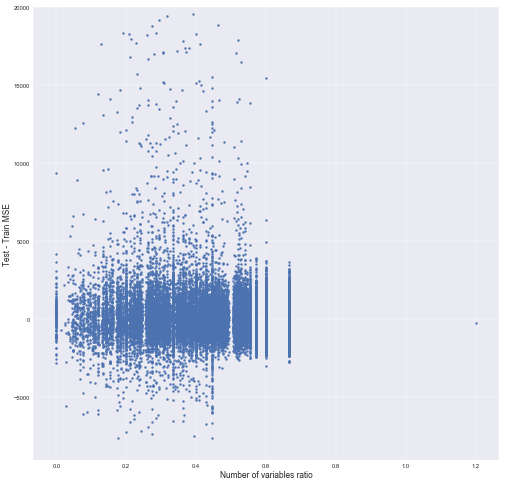

...

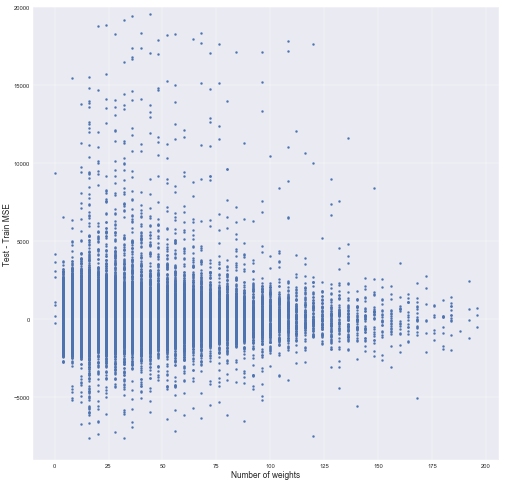

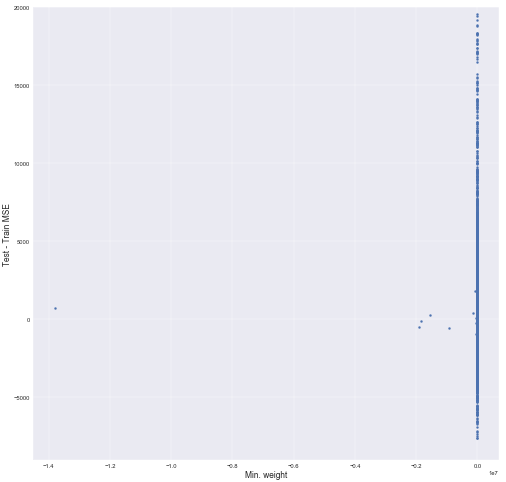

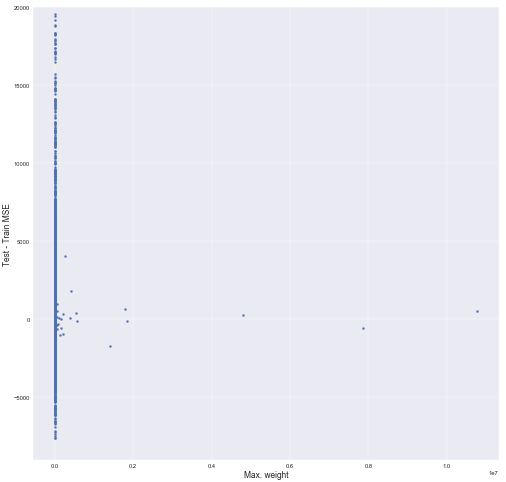

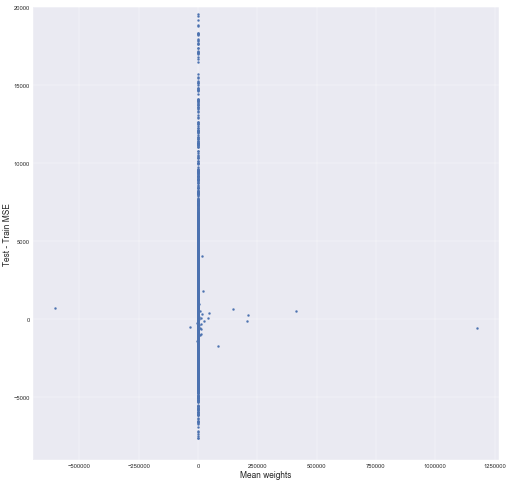

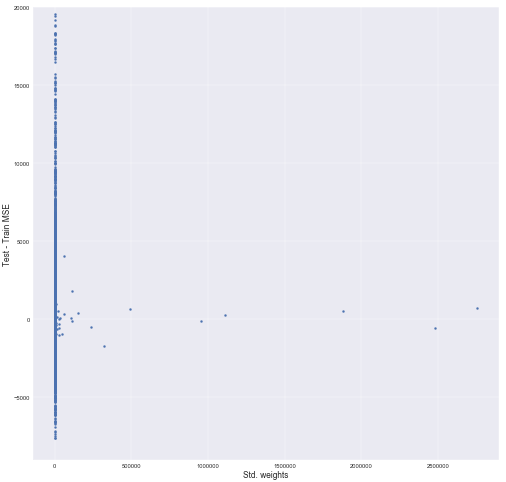

In [116]:
for i in range(len(stats[0])):
    fig = plt.figure(num=None, figsize=(20, 20), dpi=30, facecolor='w', edgecolor='k')
    signal = [s[i] for s in stats]
    plt.scatter(signal, diff_mse)
    axes = plt.gca()
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Test - Train MSE", size = 20)
    axes.set_ylim(bottom=-9000, top = 20000)
    plt.savefig("overfitting_" + str(i) + ".jpg")
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: add nodes ratio, std constants
# -> <=-shape: /
# -> pos correlation: 
# -> neg. correlation: 

### Correlations overall (aggregated across cross-val): test mse - train mse & final function

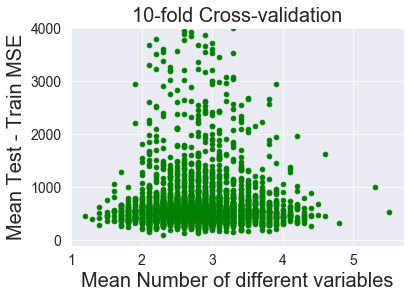

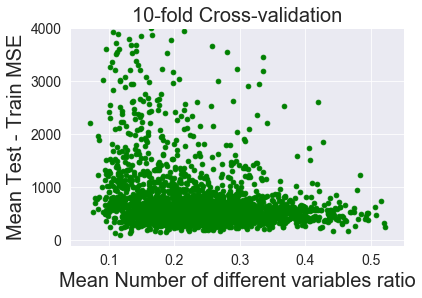

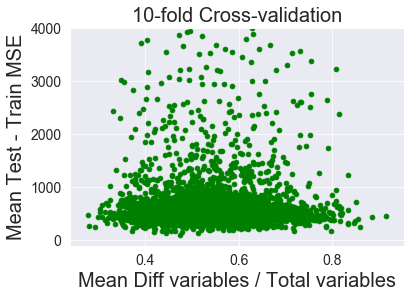

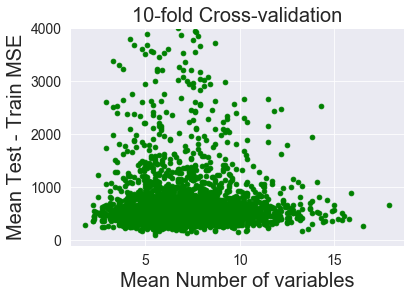

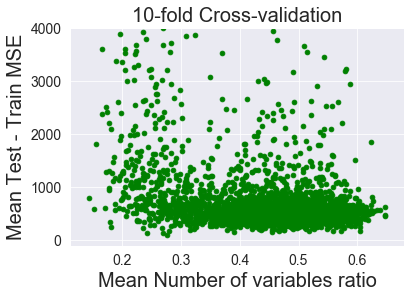

...

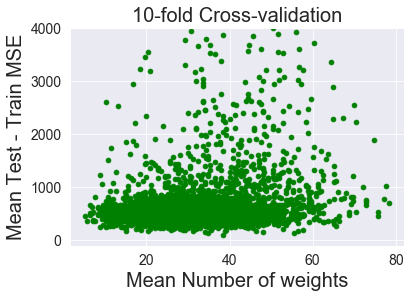

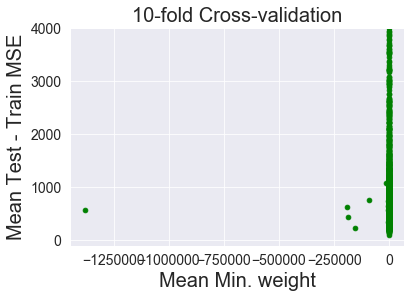

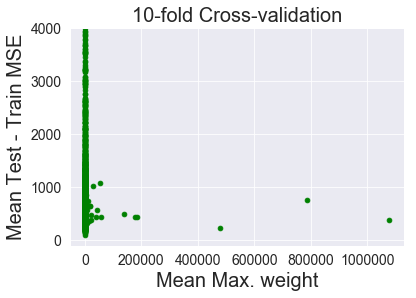

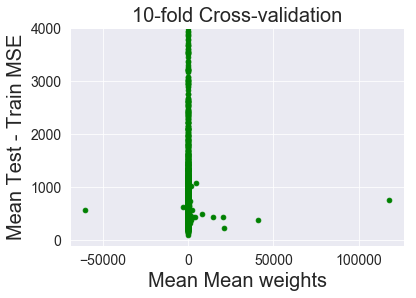

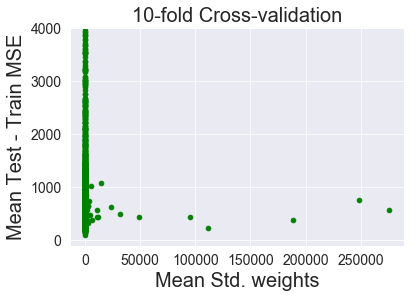

In [19]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, diff_mse_agg, color = "green")
    axes = plt.gca()
    plt.title("10-fold Cross-validation")
    axes.set_xlabel("Mean " + statsNames[i], size = 20)
    axes.set_ylabel("Mean Test - Train MSE", size = 20)
    axes.set_ylim(bottom=-100, top = 4000)
    plt.show()
# -> >-shapes: std constants
# -> <-shapes: /
# -> >=-shape: different variables ratio, add nodes ratio, constants ratio
# -> <=-shape: /
# -> pos correlation: 
# -> neg. correlation: 

### Correlations voerall: train MSE - final function

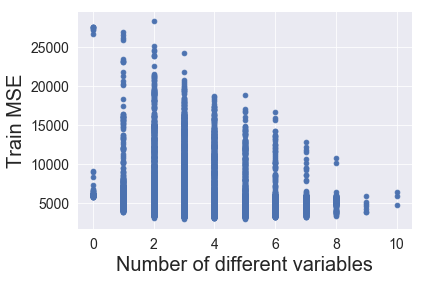

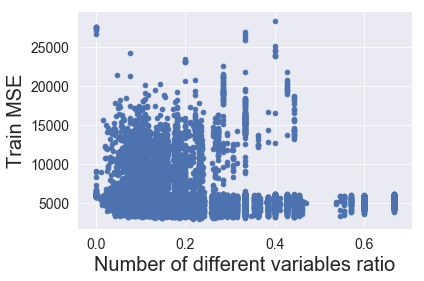

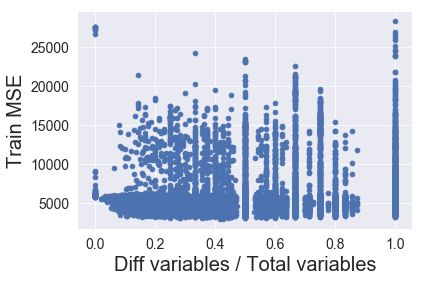

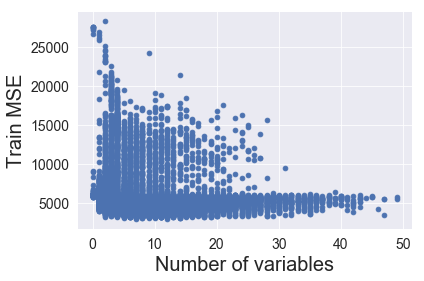

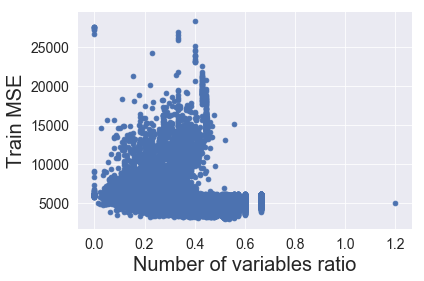

...

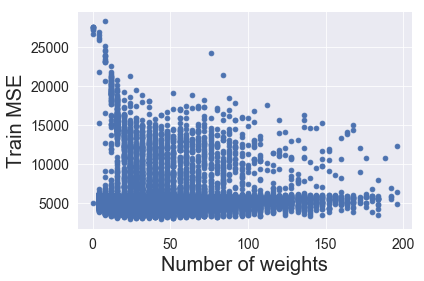

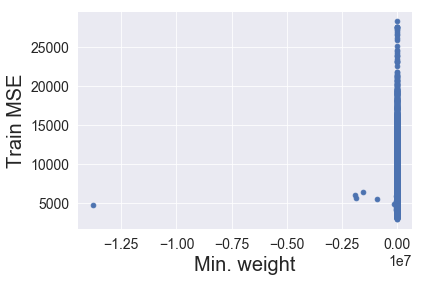

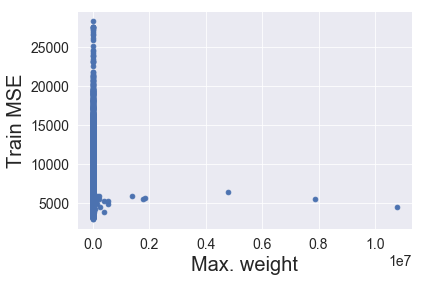

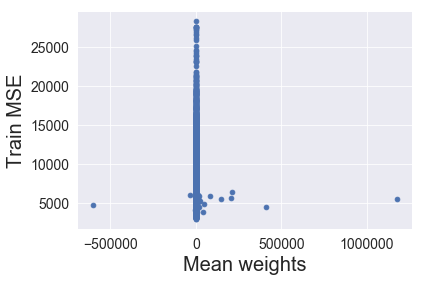

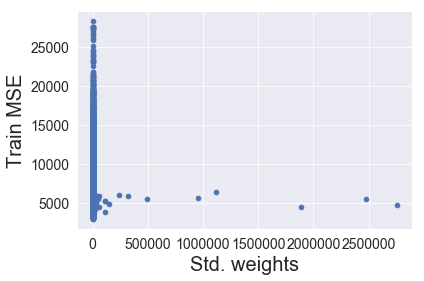

In [20]:
for i in range(len(stats[0])):
    signal = [s[i] for s in stats]
    plt.scatter(signal, train_mse)
    axes = plt.gca()
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Train MSE", size = 20)
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: / std constants
# -> <=-shape: / mean constants, max constants, min constants, number of variables ratio
# -> pos correlation: 
# -> neg. correlation: 

### Correlations overall (aggregated across Cross-val): train MSE - Final Function

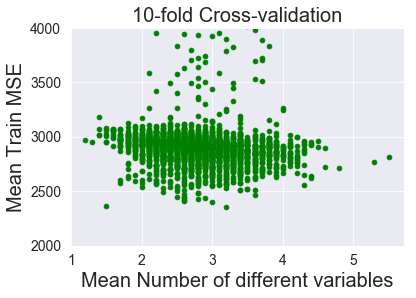

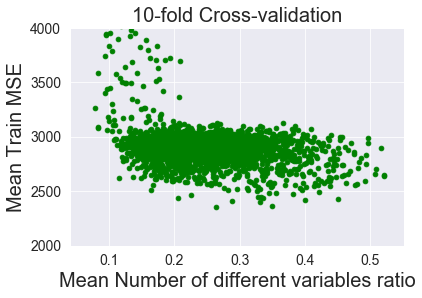

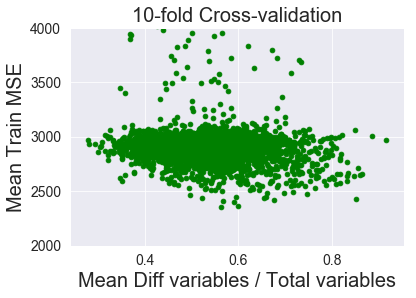

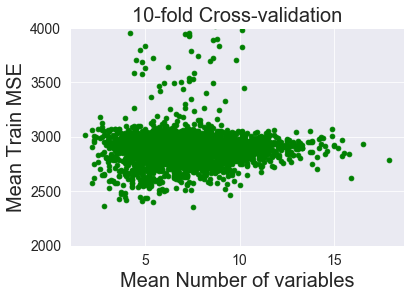

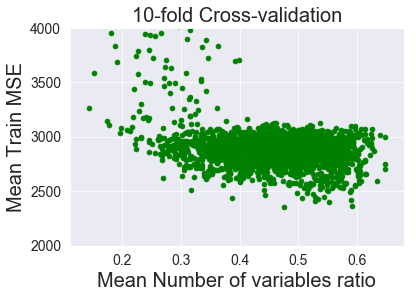

...

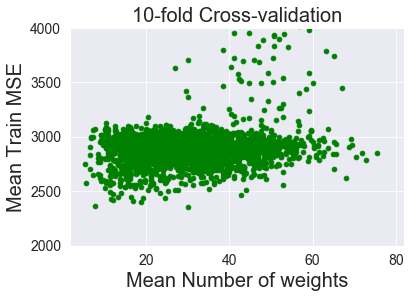

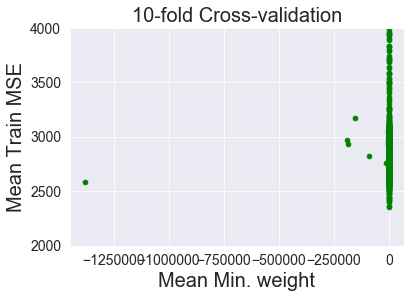

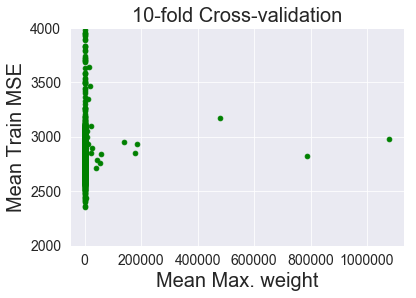

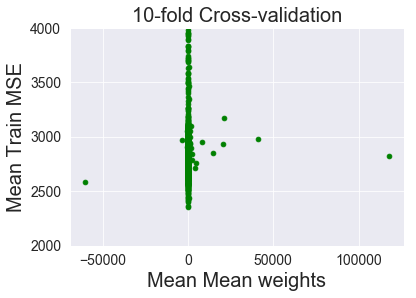

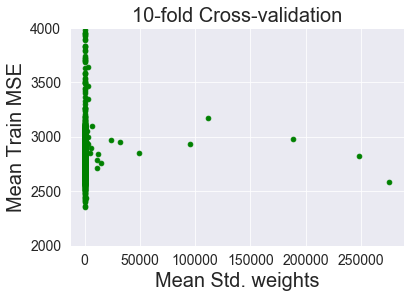

In [25]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, train_mse_agg, color = "green")
    axes = plt.gca()
    plt.title("10-fold Cross-validation")
    axes.set_xlabel("Mean " + statsNames[i], size = 20)
    axes.set_ylabel("Mean Train MSE", size = 20)
    axes.set_ylim(bottom=2000, top = 4000)
    plt.show()
# -> >-shapes: div nodes ratio, constants ratio, min constant, max constant, mean constants, std constants
# -> <-shapes: number of variables ratio, add nodes ratio
# -> >=-shape: /
# -> <=-shape: /
# -> pos correlation: /
# -> neg. correlation: /

### Correlations overall: Train MSE in Initial Population - Final Function

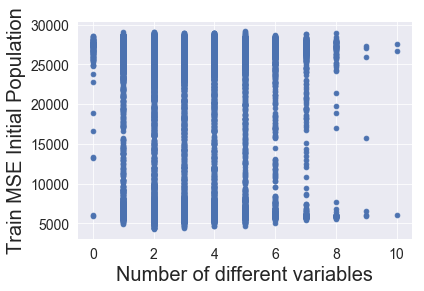

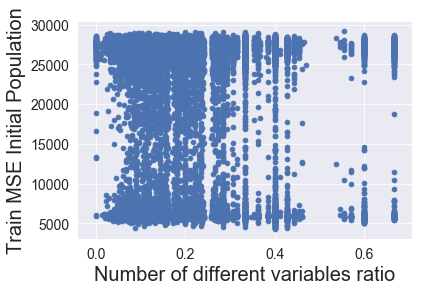

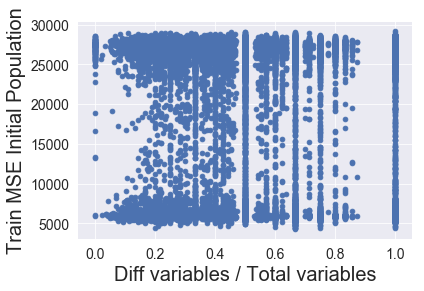

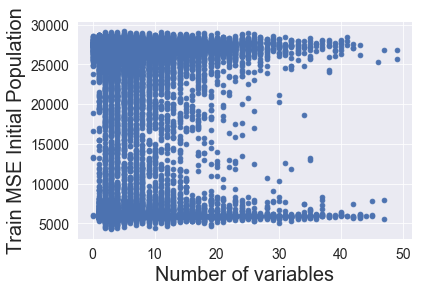

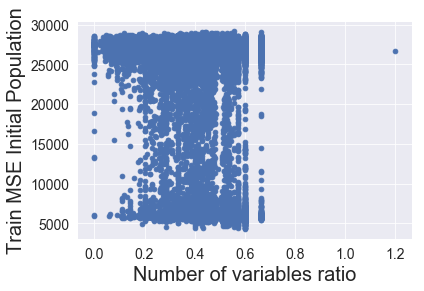

...

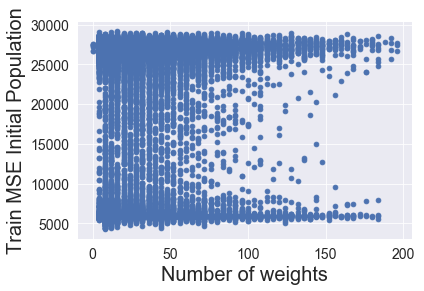

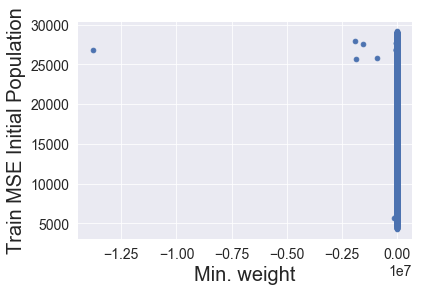

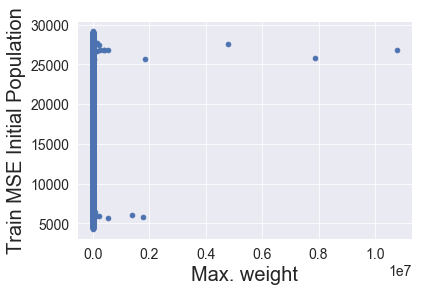

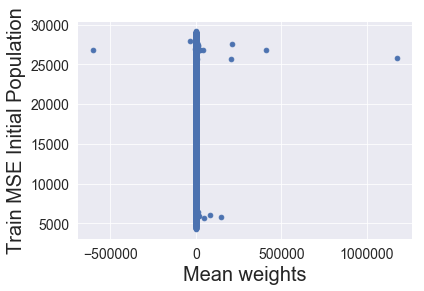

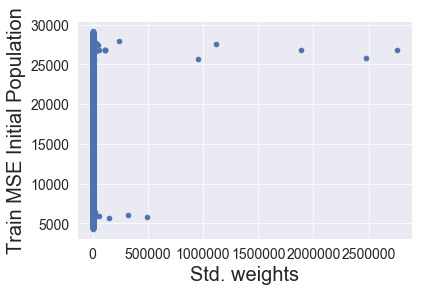

In [26]:
for i in range(len(stats[0])):
    signal = [s[i] for s in stats]
    plt.scatter(signal, gen0_mse)
    axes = plt.gca()
    axes.set_xlabel(statsNames[i], size = 20)
    axes.set_ylabel("Train MSE Initial Population", size = 20)
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: /
# -> <=-shape: /
# -> pos correlation: /
# -> neg. correlation: /

### Correlations overall (aggregated across cross-validation): Train MSE in Initial Population - Final Function

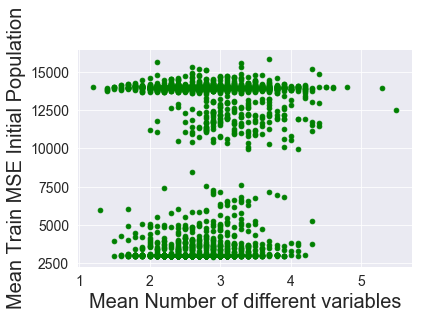

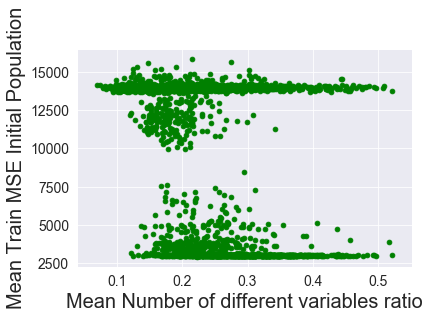

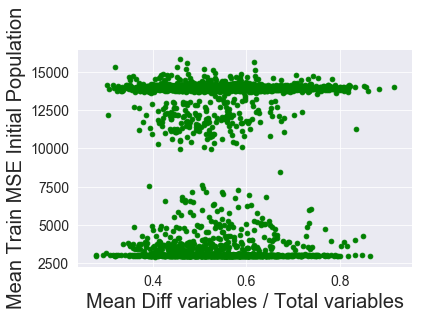

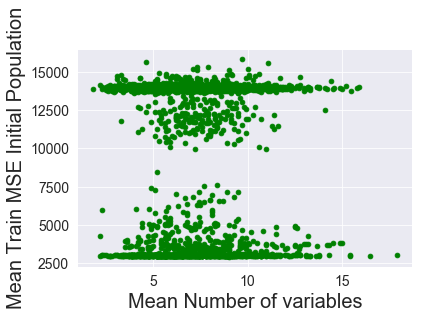

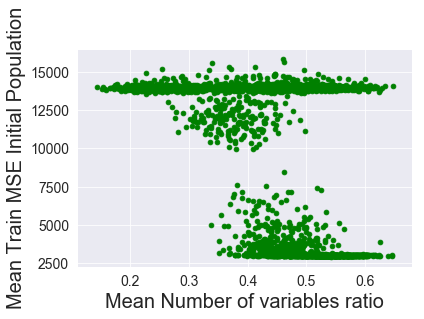

...

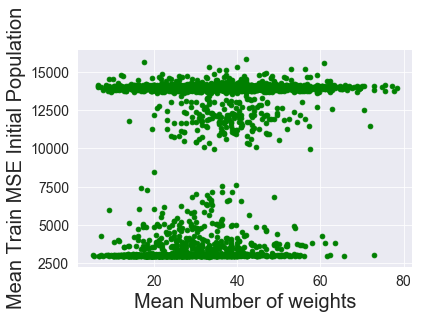

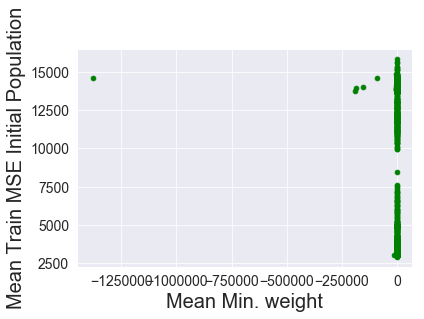

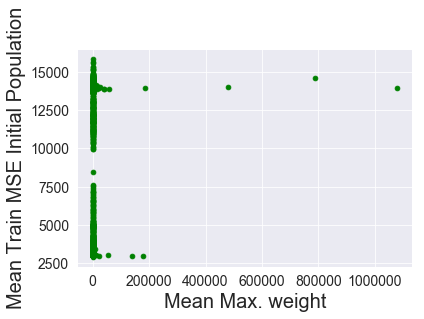

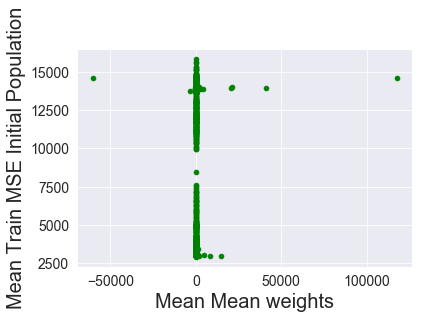

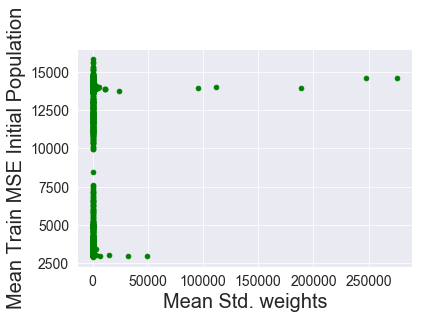

In [27]:
for i in range(len(stats[0])):
    signal = [stats_agg[s][i] for s in range(len(stats_agg))]
    plt.scatter(signal, gen0_mse_agg, color = "green")
    axes = plt.gca()
    axes.set_xlabel("Mean " + statsNames[i], size = 20)
    axes.set_ylabel("Mean Train MSE Initial Population", size = 20)
    plt.show()
# -> >-shapes: /
# -> <-shapes: /
# -> >=-shape: /
# -> <=-shape: /
# -> pos correlation: /
# -> neg. correlation: /

### Impact of amount of backprop (number of iterations, ratio of individuals, number of generations)
###    (all other parameters are set to best params: learning rate, initial generations, initial backprop)

Number of variables ratio


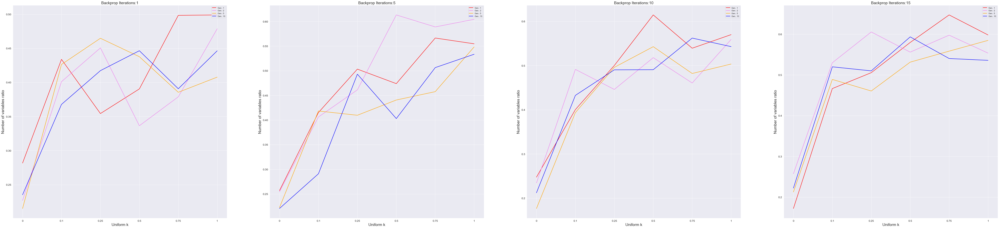

Number of add nodes ratio


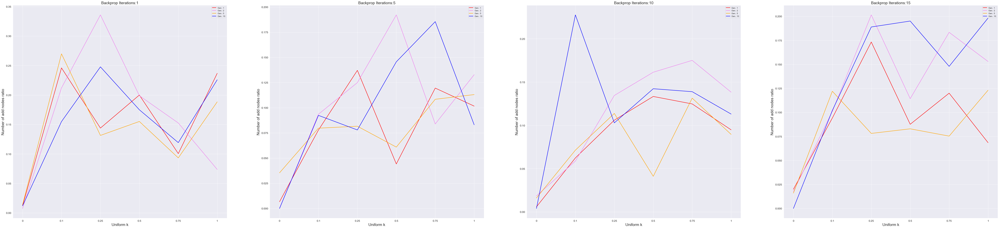

Number of constants ratio


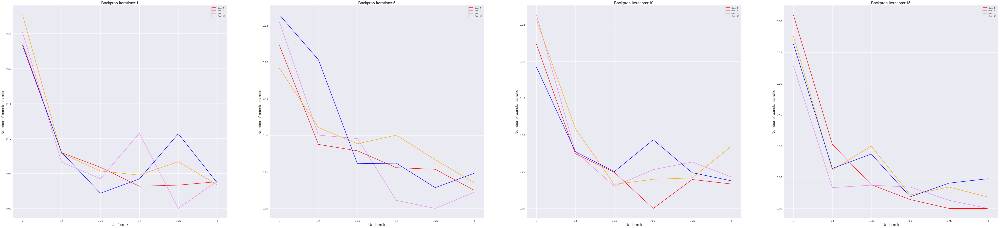

Mean constants


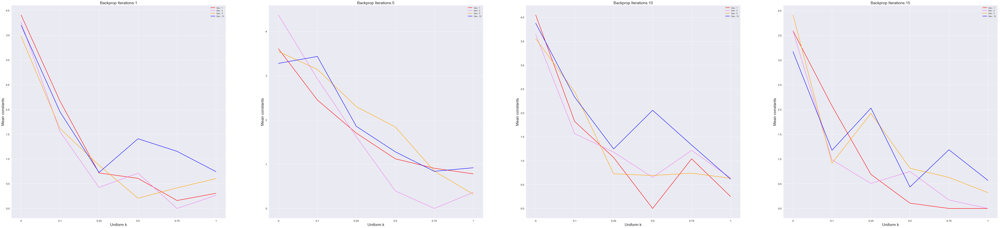

Std. constants


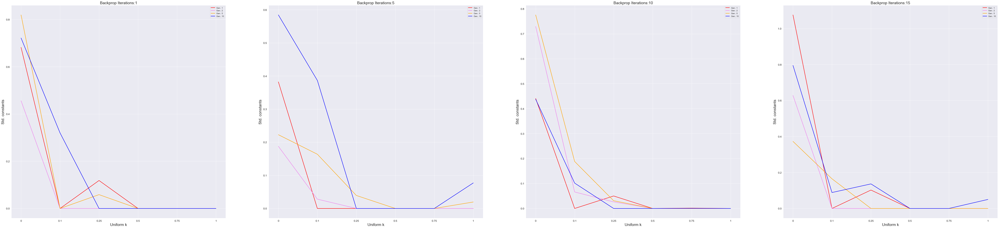

In [44]:
backpropGeneration = [1, 2, 5, 10] # every how many generations to perfrom backprop
bIterations = [1, 5, 10, 15] # how many iterations of backprop to perform
uniformK = [0, 0.1, 0.25, 0.5, 0.75, 1] # ratio of individuals to apply backprop to

statsIndices =[4, 6, 12, 15, 16]
for statsIndex in statsIndices:
    title = statsNames[statsIndex]
    print(title)
    
    # Initialize array
    res = []
    for i in bIterations:
        resI = []
        for g in backpropGeneration:
            resG = []
            for u in uniformK:
                resG.append([])
            resI.append(resG)
        res.append(resI)

    # Determine parameter values of each file               
    for fIndex, f in enumerate(all_files):
        index = f.find("gen") + 3
        character = f[index]
        g = ""
        while character.isdigit():
            g += character
            index += 1
            character = f[index]

        index = f.find("_it") + 3
        character = f[index]
        i = ""
        while character.isdigit():
            i += character
            index += 1
            character = f[index]

        index = f.find("unK") + 3
        character = f[index]
        u = ""
        while character.isdigit() or character == ".":
            u += character
            index += 1
            character = f[index]

        index = f.find("_lr") + 3
        character = f[index]
        lRate = ""
        while character.isdigit() or character == ".":
            lRate += character
            index += 1
            character = f[index]

        index = f.find("_initial") + 8
        initialBackpropagation = f[index]

        index = f.find("_firstGen") + 9
        character = f[index]
        firstG = ""
        while character.isdigit():
            firstG += character
            index += 1
            character = f[index]


        if len(u) > 0 and initialBackpropagation == "0" and lRate == "0.1" and len(firstG) > 5:
            res[bIterations.index(int(i))][backpropGeneration.index(int(g))][uniformK.index(float(u))].append(stats[fIndex][statsIndex])

    colors = ["red", "violet", "orange", "blue", "turquoise", "lightblue", 
              "darkgreen", "limegreen", "#ffea00"]

    # Plots for uniform k
    fig = plt.figure(num=None, figsize=(90, 20), dpi=70, facecolor='w', edgecolor='k')
    numPlots = len(bIterations)
    for iIndex, i in enumerate(bIterations):
        c = 0
        plt.subplot(1, len(bIterations), iIndex + 1)
        for gIndex, g in enumerate(backpropGeneration):
            vals = [np.mean(x) for x in res[iIndex][gIndex]] # averages
            lb = [sms.DescrStatsW(x).tconfint_mean()[0] for x in res[iIndex][gIndex]]
            ub = [sms.DescrStatsW(x).tconfint_mean()[1] for x in res[iIndex][gIndex]]
            plt.plot(np.arange(len(uniformK)), vals,  color = colors[c], linestyle = "-", 
                         linewidth = 2, label = "Gen.: " + str(g))
            #plt.fill_between(range(np.array(vals).shape[0]), ub, 
            #         lb, color = colors[c], alpha=.2) # confidence intervals
            c += 1

        axes = plt.gca()
        axes.set_xlabel("Uniform k", size = 20)
        axes.set_ylabel(title, size = 20)
        plt.title("Backprop Iterations:" + str(i))
        plt.xticks(np.arange(len(uniformK)), uniformK)
        axes.legend(loc=1, prop={'size': 10})
    plt.show()
    #fig.savefig("Q4_ucbFixed.png", quality = 90) # save plot
    
# -

##### Impact of amount of backprop (iterations, ratio of individuals, generations) on final function attributes
##### Look at combination of the two generation parameters (every how many generations & how many first iterations)

Number of different variables
- No backprop 2.7527777777777778 with std: 1.326018709251099
- Least backprop 2.1 with std: 1.374772708486752
- Most backprop: 2.2 with std: 0.66332495807108
- Most backprop but every 2nd gen: 2.0 with std: 1.0


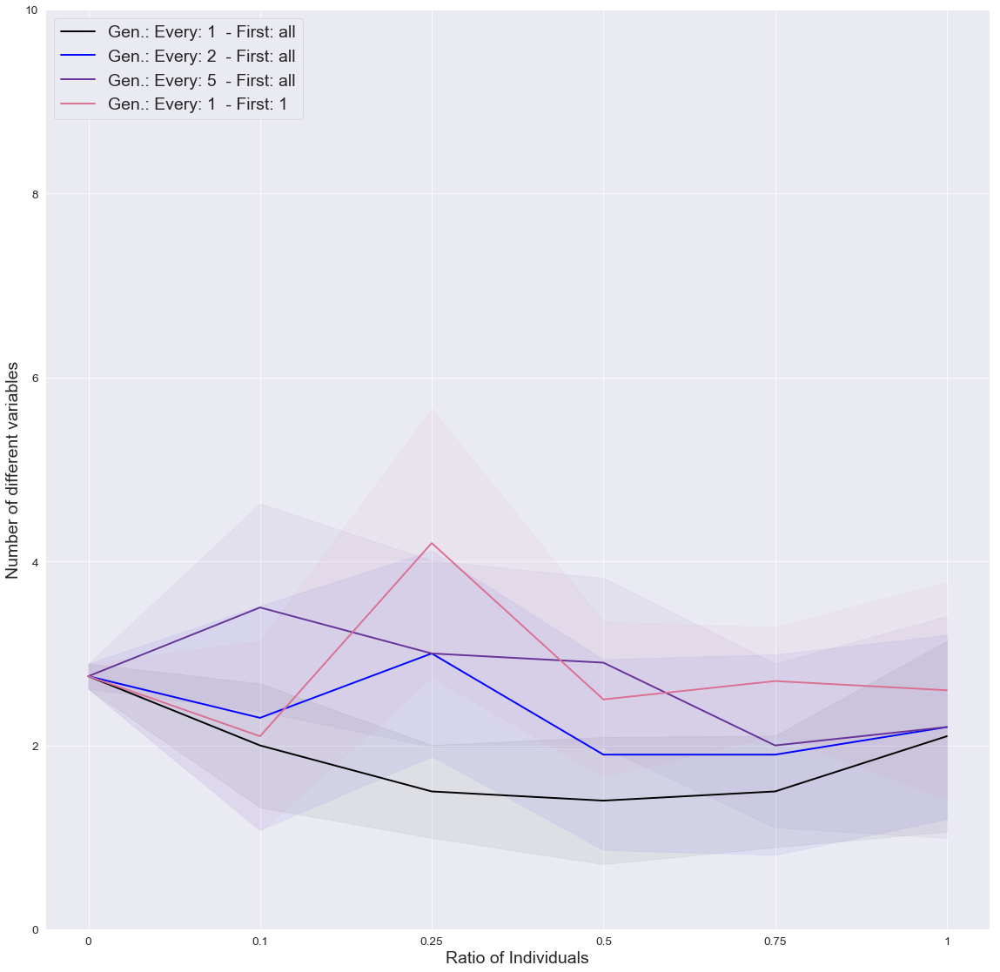

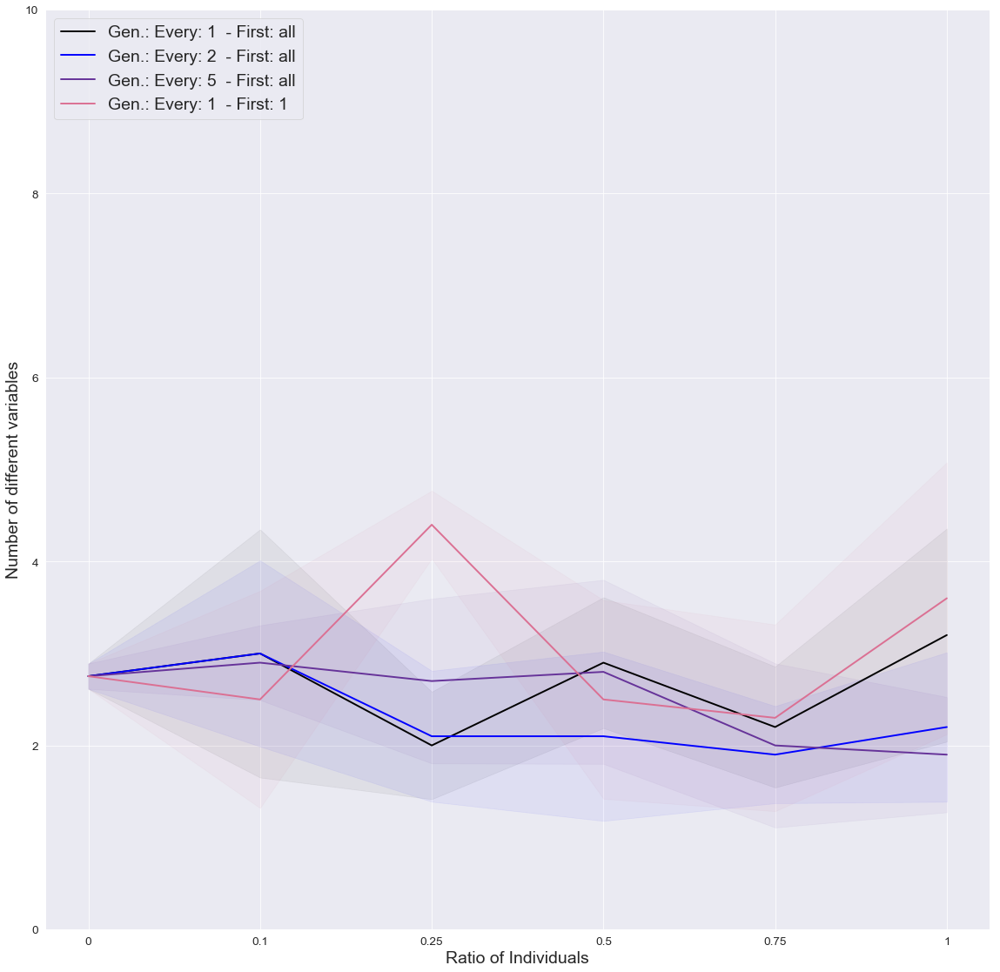

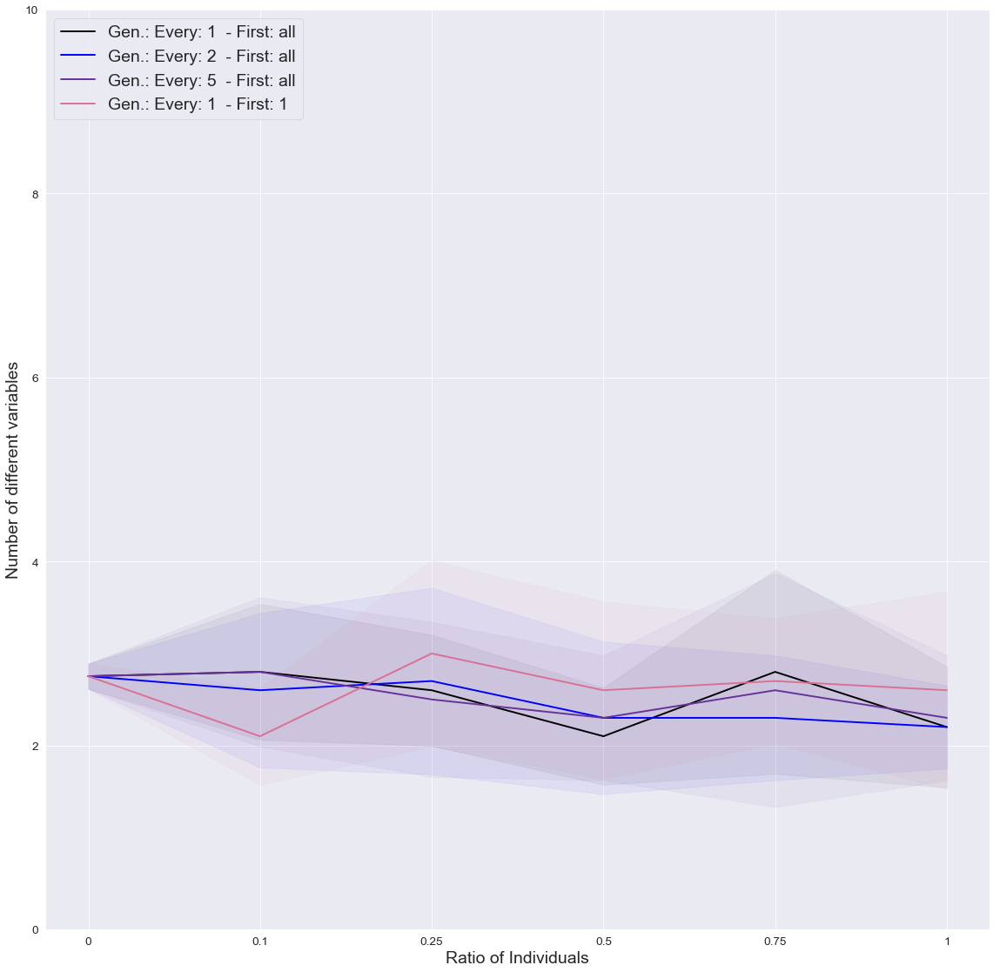

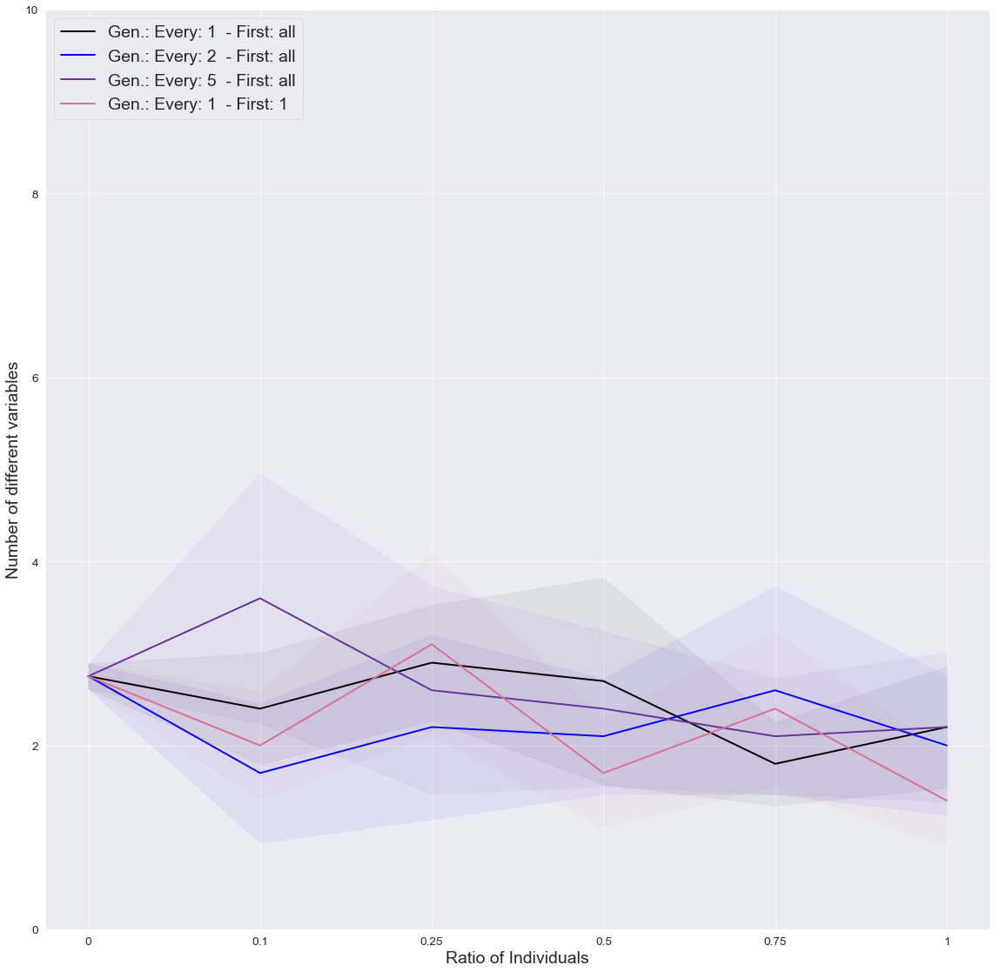

In [6]:
backpropGeneration = [1, 2, 5, 10] # every how many generations to perfrom backprop
bIterations = [1, 5, 10, 15] # how many iterations of backprop to perform
uniformK = [0, 0.1, 0.25, 0.5, 0.75, 1] # ratio of individuals to apply backprop to
genParams = ["Every: 1  - First: all", "Every: 2  - First: all", "Every: 5  - First: all", "Every: 1  - First: 5", 
             "Every: 1  - First: 3", 
             "Every: 2  - First: 5", "Every: 10 - First: all", "Every: 2  - First: 3", "Every: 1  - First: 1"]

statsIndices =[4, 6, 12, 15, 16]

for statsIndex in statsIndices:
    title = statsNames[statsIndex]
    print(title)
    
    # Initialize array
    res = []
    for i in bIterations:
        resI = []
        for g in genParams:
            resG = []
            for u in uniformK:
                resG.append([])
            resI.append(resG)
        res.append(resI)

    # Determine parameter values of each file               
    for fIndex, f in enumerate(all_files):
        index = f.find("gen") + 3
        character = f[index]
        g = ""
        while character.isdigit():
            g += character
            index += 1
            character = f[index]

        index = f.find("_it") + 3
        character = f[index]
        i = ""
        while character.isdigit():
            i += character
            index += 1
            character = f[index]

        index = f.find("unK") + 3
        character = f[index]
        u = ""
        while character.isdigit() or character == ".":
            u += character
            index += 1
            character = f[index]

        index = f.find("_lr") + 3
        character = f[index]
        lRate = ""
        while character.isdigit() or character == ".":
            lRate += character
            index += 1
            character = f[index]

        index = f.find("_initial") + 8
        initialBackpropagation = f[index]

        index = f.find("_firstGen") + 9
        character = f[index]
        firstG = ""
        while character.isdigit():
            firstG += character
            index += 1
            character = f[index]


        if len(u) > 0 and initialBackpropagation == "0" and lRate == "0.1":
            genIndex = 100
            if g == "1":
                if len(firstG) > 5:
                    genIndex = 0
                elif firstG == "5":
                    genIndex = 3
                elif firstG == "3":
                    genIndex = 4
                else:
                    genIndex = 8
            elif g == "2":
                if len(firstG) > 5:
                    genIndex = 1
                elif firstG == "5":
                    genIndex = 5
                elif firstG == "3":
                    genIndex = 7
            elif g == "5" and len(firstG) > 5:
                genIndex = 2
            elif g == "10" and len(firstG) > 5:
                genIndex = 6
            
            if not genIndex == 100:
                res[bIterations.index(int(i))][genIndex][uniformK.index(float(u))].append(stats[fIndex][statsIndex])

    colors = ["black", "darkblue", "blue", "rebeccapurple", "darkorchid", "orchid", "mediumvioletred", "palevioletred", "pink"]
    colors = ["black", "blue", "rebeccapurple", "palevioletred"]
    
    lowest = []
    for b in range(len(bIterations)):
        for g in range(len(genParams)):
            for x in res[b][g][0]:
                lowest.append(x)
    print("- No backprop", np.mean(lowest), "with std:", np.std(lowest))
    print("- Least backprop", np.mean(res[0][-1][1]), "with std:", np.std(res[0][-1][1]))
    print("- Most backprop:", np.mean(res[-1][0][-1]), "with std:", np.std(res[-1][-1][-1]))
    print("- Most backprop but every 2nd gen:", np.mean(res[-1][1][-1]), "with std:", np.std(res[-1][1][-1]))
    
    # Plots for uniform k
    #fig = plt.figure(num=None, figsize=(90, 20), dpi=70, facecolor='w', edgecolor='k')
    numPlots = len(bIterations)
    for iIndex, i in enumerate(bIterations):
        fig = plt.figure(num=None, figsize=(20, 20), dpi=70, facecolor='w', edgecolor='k')
        c = 0
        #plt.subplot(1, len(bIterations), iIndex + 1)
        for gIndex, g in enumerate(genParams):
            if gIndex in [0, 1, 2, 8]:
                vals = [np.mean(x) for x in res[iIndex][gIndex]] # averages
                vals[0] = np.mean(lowest)
                lb = [sms.DescrStatsW(x).tconfint_mean()[0] for x in res[iIndex][gIndex]]
                lb[0] = sms.DescrStatsW(lowest).tconfint_mean()[0]
                ub = [sms.DescrStatsW(x).tconfint_mean()[1] for x in res[iIndex][gIndex]]
                ub[0] = sms.DescrStatsW(lowest).tconfint_mean()[1]
                plt.plot(np.arange(len(uniformK)), vals,  color = colors[c], linestyle = "-", 
                             linewidth = 2, label = "Gen.: " + str(g))
                plt.fill_between(range(np.array(vals).shape[0]), ub, 
                         lb, color = colors[c], alpha=.05) # confidence intervals
                c += 1
        
        axes = plt.gca()
        axes.set_xlabel("Ratio of Individuals", size = 20)
        axes.set_ylabel(title, size = 20)
        axes.set_ylim(bottom = 0, top = 10)
        plt.title("Backprop Iterations:" + str(i))
        plt.xticks(np.arange(len(uniformK)), uniformK)
        axes.legend(loc=2, prop={'size': 20})
        plt.show()
        fig.savefig("finalfunction_" + title + "_Iter" + str(i) + ".jpg", quality = 90) # save plot


##### Impact of amount of backprop (iterations, generations, ratio of individuals) on test MSE, tree size, etc.

Test MSE


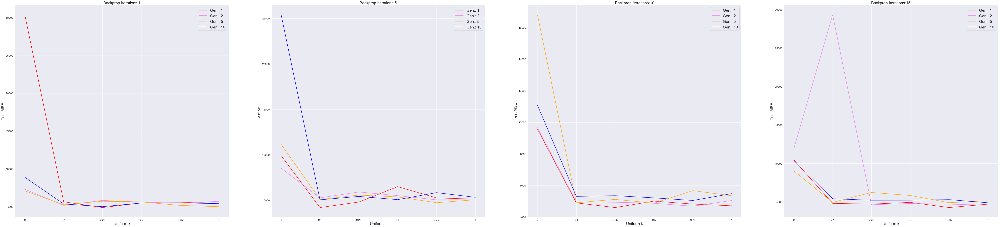

Tree Size


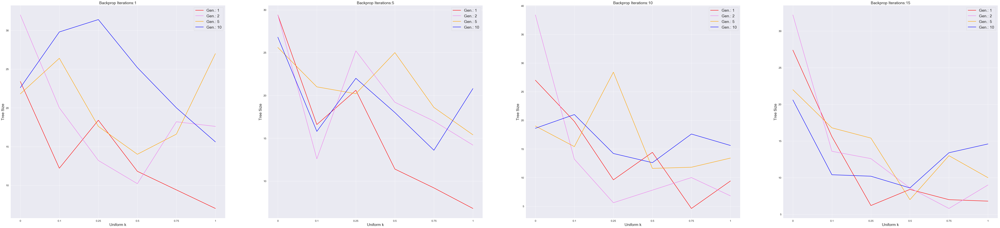

Test MSE - Train MSE


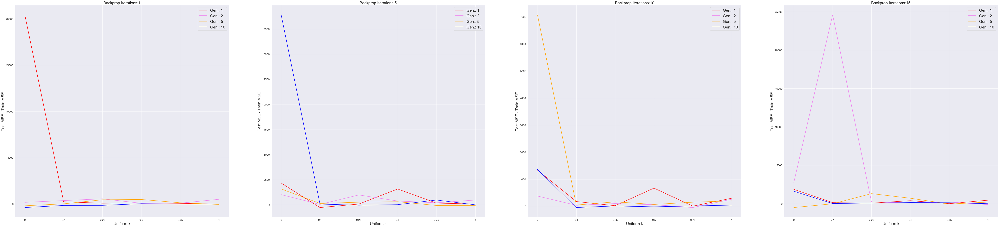

Train MSE


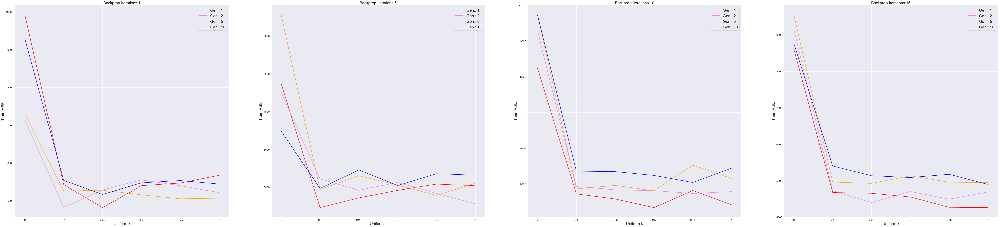

Number of Generations


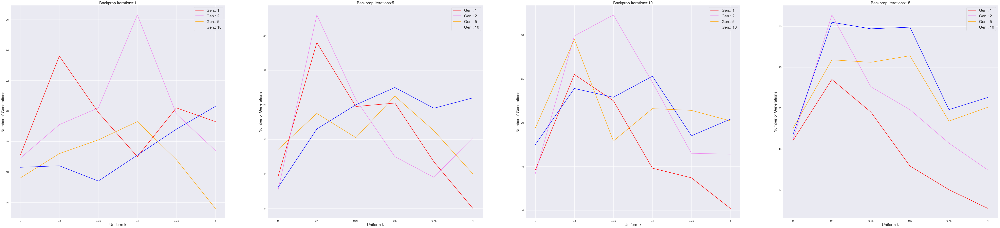

Train MSE Initial Population


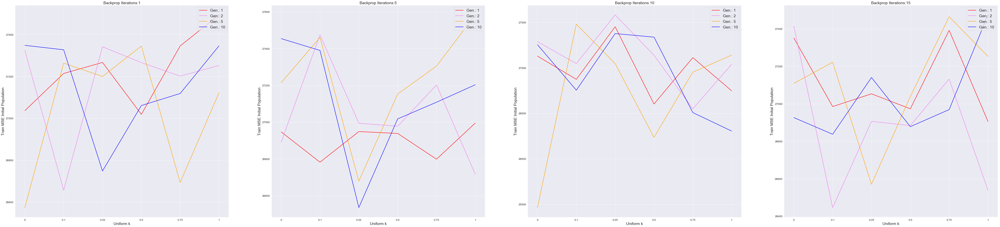

In [10]:
backpropGeneration = [1, 2, 5, 10] # every how many generations to perfrom backprop
bIterations = [1, 5, 10, 15] # how many iterations of backprop to perform
uniformK = [0, 0.1, 0.25, 0.5, 0.75, 1] # ratio of individuals to apply backprop to

metrics = [test_mse, tree_size, diff_mse, train_mse, numGen, gen0_mse]
metricName = ["Test MSE", "Tree Size", "Test MSE - Train MSE", "Train MSE", "Number of Generations", 
             "Train MSE Initial Population"]
for metricIndex, metric in enumerate(metrics):
    title = metricName[metricIndex]
    print(title)
    
    # Initialize array
    res = []
    for i in bIterations:
        resI = []
        for g in backpropGeneration:
            resG = []
            for u in uniformK:
                resG.append([])
            resI.append(resG)
        res.append(resI)

    # Determine parameter values of each file               
    for fIndex, f in enumerate(all_files):
        index = f.find("gen") + 3
        character = f[index]
        g = ""
        while character.isdigit():
            g += character
            index += 1
            character = f[index]

        index = f.find("_it") + 3
        character = f[index]
        i = ""
        while character.isdigit():
            i += character
            index += 1
            character = f[index]

        index = f.find("unK") + 3
        character = f[index]
        u = ""
        while character.isdigit() or character == ".":
            u += character
            index += 1
            character = f[index]

        index = f.find("_lr") + 3
        character = f[index]
        lRate = ""
        while character.isdigit() or character == ".":
            lRate += character
            index += 1
            character = f[index]

        index = f.find("_initial") + 8
        initialBackpropagation = f[index]

        index = f.find("_firstGen") + 9
        character = f[index]
        firstG = ""
        while character.isdigit():
            firstG += character
            index += 1
            character = f[index]


        if len(u) > 0 and initialBackpropagation == "0" and lRate == "0.001" and len(firstG) > 5:
            res[bIterations.index(int(i))][backpropGeneration.index(int(g))][uniformK.index(float(u))].append(metrics[metricIndex][fIndex])

    colors = ["red", "violet", "orange", "blue", "turquoise", "lightblue", 
              "darkgreen", "limegreen", "#ffea00"]

    # Plots for uniform k
    fig = plt.figure(num=None, figsize=(90, 20), dpi=70, facecolor='w', edgecolor='k')
    numPlots = len(bIterations)
    for iIndex, i in enumerate(bIterations):
        c = 0
        plt.subplot(1, len(bIterations), iIndex + 1)
        for gIndex, g in enumerate(backpropGeneration):
            vals = [np.mean(x) for x in res[iIndex][gIndex]] # averages
            lb = [sms.DescrStatsW(x).tconfint_mean()[0] for x in res[iIndex][gIndex]]
            ub = [sms.DescrStatsW(x).tconfint_mean()[1] for x in res[iIndex][gIndex]]
            plt.plot(np.arange(len(uniformK)), vals,  color = colors[c], linestyle = "-", 
                         linewidth = 2, label = "Gen.: " + str(g))
            c += 1

        axes = plt.gca()
        axes.set_xlabel("Uniform k", size = 20)
        axes.set_ylabel(title, size = 20)
        plt.title("Backprop Iterations:" + str(i))
        plt.xticks(np.arange(len(uniformK)), uniformK)
        axes.legend(loc=1, prop={'size': 20})
    plt.show()


Number of Generations
- No backprop 17.169444444444444 with std: 10.030324007296974
- Least backprop 26.5 with std: 4.904079934095692
- Most backprop: 10.1 with std: 17.010584939971935
- Single iteration, 0.1 individuals, most gen: 28.9 with std: 13.3
- Single iteration, single gen, all individuals: 20.9 with std: 3.534119409414459
- Single gen, 0.1 individuals, all iterations: 35.8 with std: 15.522886329545804


<Figure size 6300x1400 with 0 Axes>

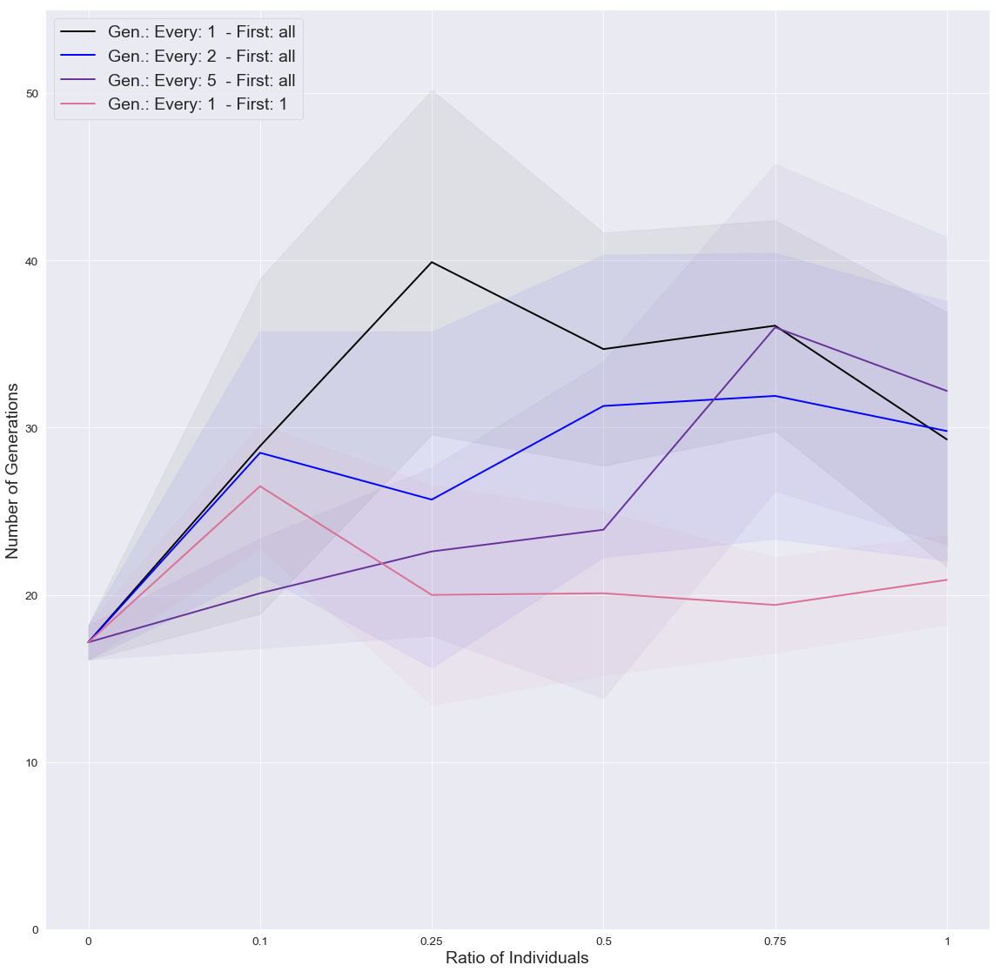

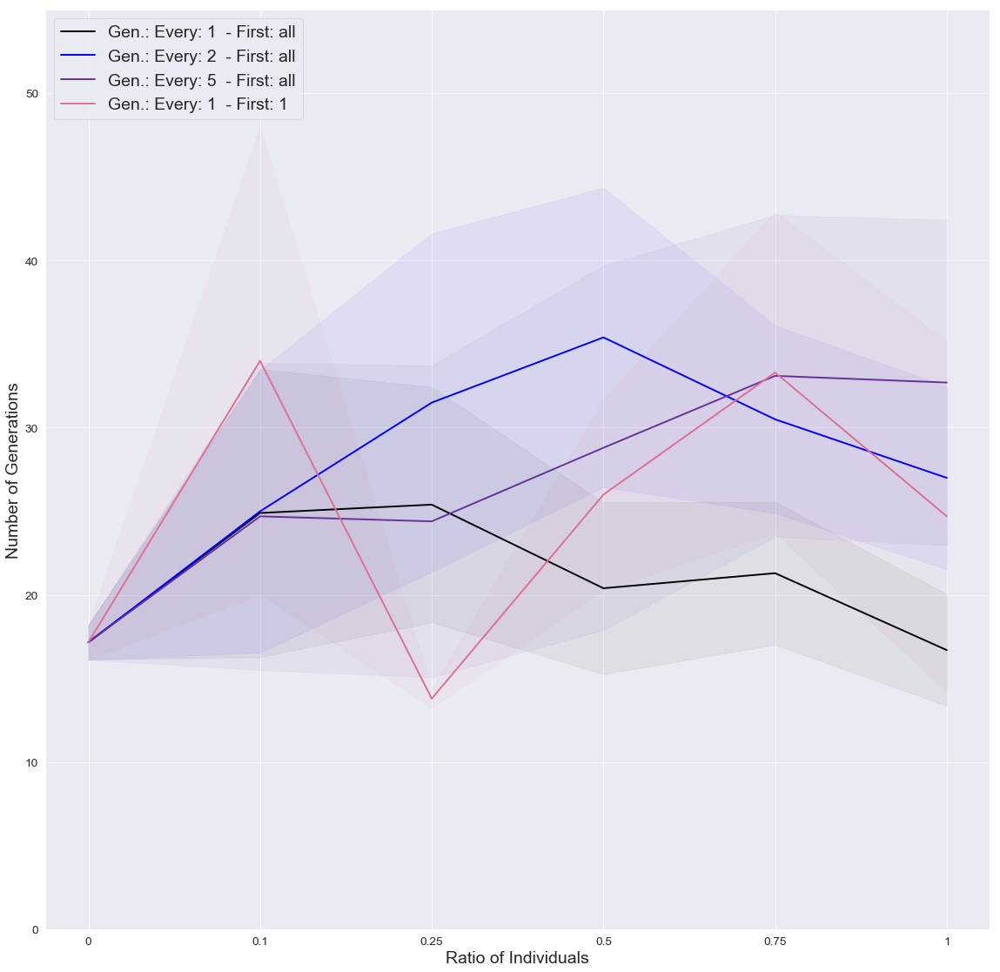

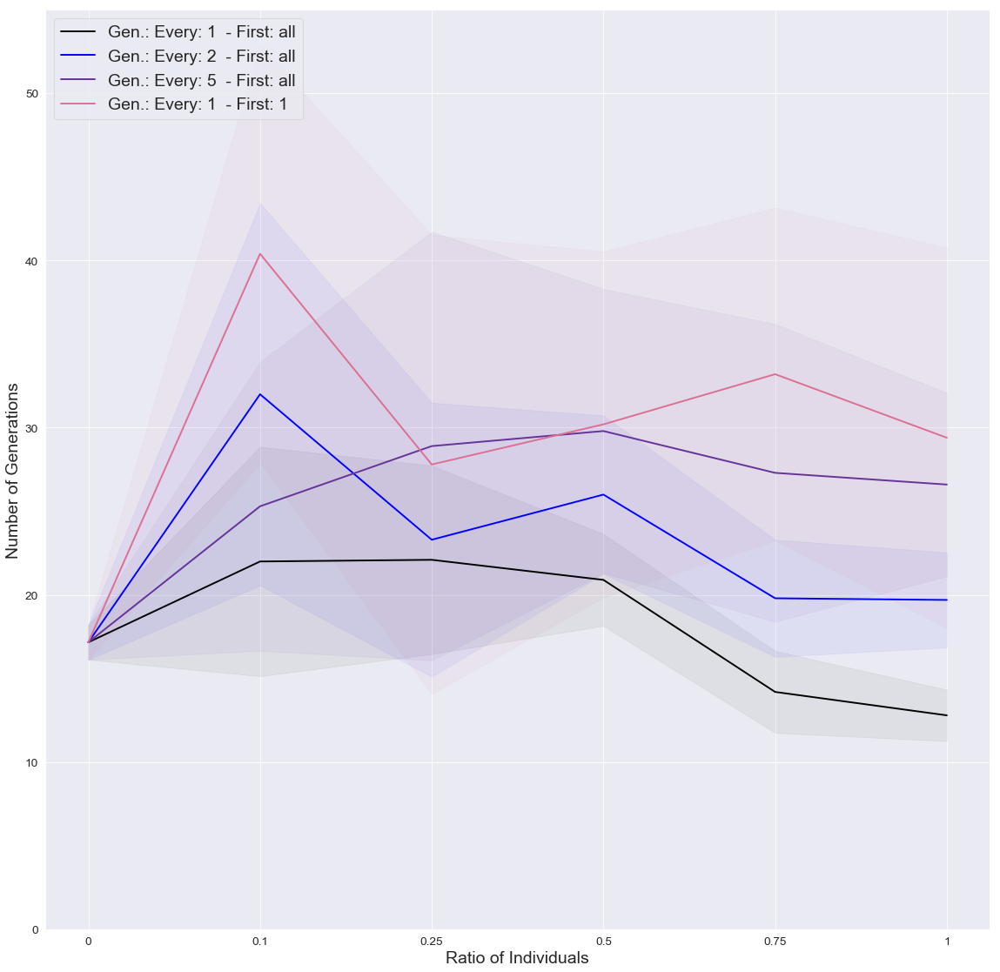

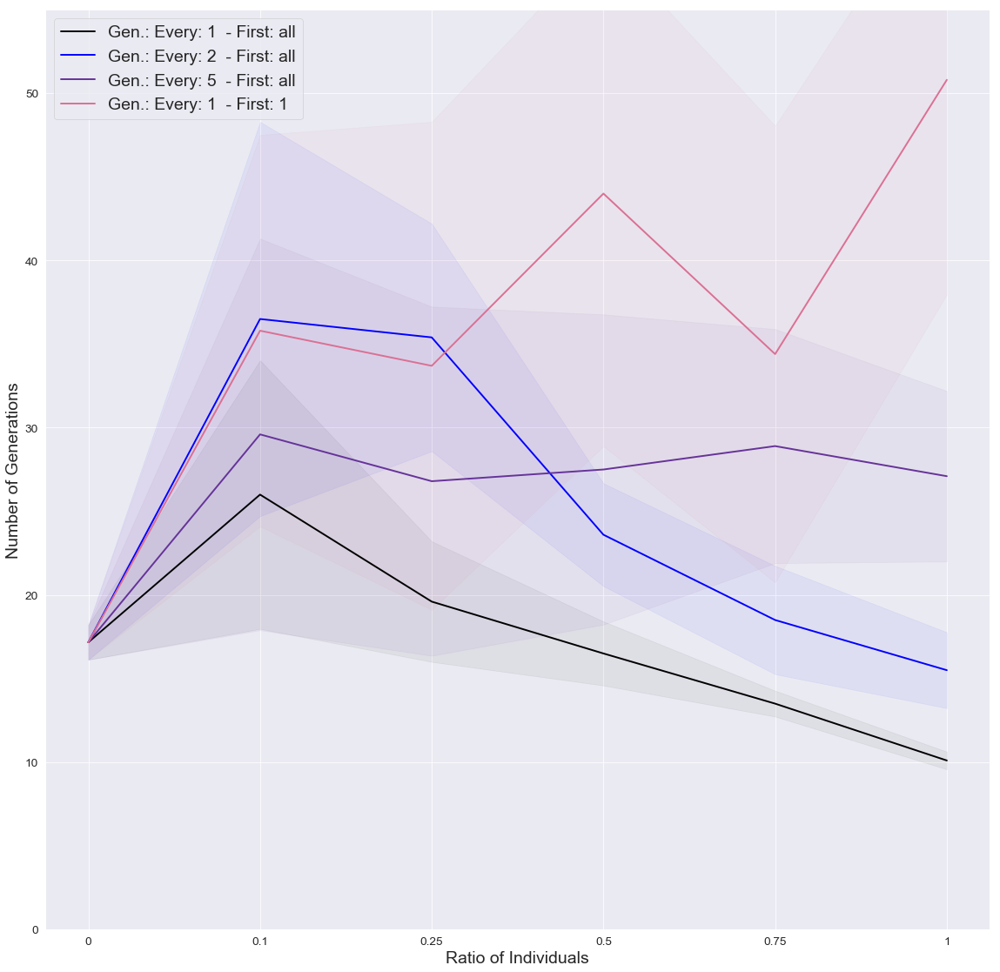

In [13]:
backpropGeneration = [1, 2, 5, 10] # every how many generations to perfrom backprop
bIterations = [1, 5, 10, 15] # how many iterations of backprop to perform
uniformK = [0, 0.1, 0.25, 0.5, 0.75, 1] # ratio of individuals to apply backprop to
genParams = ["Every: 1  - First: all", "Every: 2  - First: all", "Every: 5  - First: all", "Every: 1  - First: 5", 
             "Every: 1  - First: 3", 
             "Every: 2  - First: 5", "Every: 10 - First: all", "Every: 2  - First: 3", "Every: 1  - First: 1"]

metrics = [test_mse, tree_size, diff_mse, train_mse, numGen, gen0_mse]
metricName = ["Test MSE", "Tree Size", "Test MSE - Train MSE", "Train MSE", "Number of Generations", 
             "Train MSE Initial Population"]

for metricIndex, metric in enumerate(metrics):
    title = metricName[metricIndex]
    print(title)
    
    # Initialize array
    res = []
    for i in bIterations:
        resI = []
        for g in genParams:
            resG = []
            for u in uniformK:
                resG.append([])
            resI.append(resG)
        res.append(resI)

    # Determine parameter values of each file               
    for fIndex, f in enumerate(all_files):
        index = f.find("gen") + 3
        character = f[index]
        g = ""
        while character.isdigit():
            g += character
            index += 1
            character = f[index]

        index = f.find("_it") + 3
        character = f[index]
        i = ""
        while character.isdigit():
            i += character
            index += 1
            character = f[index]

        index = f.find("unK") + 3
        character = f[index]
        u = ""
        while character.isdigit() or character == ".":
            u += character
            index += 1
            character = f[index]

        index = f.find("_lr") + 3
        character = f[index]
        lRate = ""
        while character.isdigit() or character == ".":
            lRate += character
            index += 1
            character = f[index]

        index = f.find("_initial") + 8
        initialBackpropagation = f[index]

        index = f.find("_firstGen") + 9
        character = f[index]
        firstG = ""
        while character.isdigit():
            firstG += character
            index += 1
            character = f[index]
        
        # determine generations settings index
        if len(u) > 0 and initialBackpropagation == "0" and lRate == "0.1":
            genIndex = 100
            if g == "1":
                if len(firstG) > 5:
                    genIndex = 0
                elif firstG == "5":
                    genIndex = 3
                elif firstG == "3":
                    genIndex = 4
                else:
                    genIndex = 8
            elif g == "2":
                if len(firstG) > 5:
                    genIndex = 1
                elif firstG == "5":
                    genIndex = 5
                elif firstG == "3":
                    genIndex = 7
            elif g == "5" and len(firstG) > 5:
                genIndex = 2
            elif g == "10" and len(firstG) > 5:
                genIndex = 6
            
            # store results of this file
            if not genIndex == 100:
                res[bIterations.index(int(i))][genIndex][uniformK.index(float(u))].append(metrics[metricIndex][fIndex])

    colors = ["black", "darkblue", "blue", "rebeccapurple", "darkorchid", "orchid", "mediumvioletred", "palevioletred", "pink"]
    colors = ["black", "blue", "rebeccapurple", "palevioletred"]
    
    # Get all settings in which 0 individuals were used for backprop to get value for when no backprop is used
    lowest = []
    for b in range(len(bIterations)):
        for g in range(len(genParams)):
            for x in res[b][g][0]:
                lowest.append(x)
    
    # Print some statistics for specific settings
    print("- No backprop", np.mean(lowest), "with std:", np.std(lowest))
    print("- Least backprop", np.mean(res[0][-1][1]), "with std:", np.std(res[0][-1][1]))
    print("- Most backprop:", np.mean(res[-1][0][-1]), "with std:", np.std(res[-1][-1][-1]))
    print("- Single iteration, 0.1 individuals, most gen:", np.mean(res[0][0][1]), "with std:", np.std(res[0][0][1]))
    print("- Single iteration, single gen, all individuals:", np.mean(res[0][-1][-1]), "with std:", np.std(res[0][-1][-1]))
    print("- Single gen, 0.1 individuals, all iterations:", np.mean(res[-1][-1][1]), "with std:", np.std(res[-1][-1][1]))
    
    # Plots
    fig = plt.figure(num=None, figsize=(90, 20), dpi=70, facecolor='w', edgecolor='k')
    numPlots = len(bIterations)
    for iIndex, i in enumerate(bIterations): # for each number of iterations of backprop
        fig = plt.figure(num=None, figsize=(20, 20), dpi=70, facecolor='w', edgecolor='k')
        c = 0
        #plt.subplot(1, len(bIterations), iIndex + 1)
        for gIndex, g in enumerate(genParams):
            if gIndex in [0, 1, 2, 8]:
                vals = [np.mean(x) for x in res[iIndex][gIndex]] # averages
                vals[0] = np.mean(lowest)
                lb = [sms.DescrStatsW(x).tconfint_mean()[0] for x in res[iIndex][gIndex]]
                lb[0] = sms.DescrStatsW(lowest).tconfint_mean()[0]
                ub = [sms.DescrStatsW(x).tconfint_mean()[1] for x in res[iIndex][gIndex]]
                ub[0] = sms.DescrStatsW(lowest).tconfint_mean()[1]
                plt.plot(np.arange(len(uniformK)), vals,  color = colors[c], linestyle = "-", 
                             linewidth = 2, label = "Gen.: " + str(g))
                plt.fill_between(range(np.array(vals).shape[0]), ub, 
                         lb, color = colors[c], alpha=.05) # confidence intervals
                c += 1

        axes = plt.gca()
        axes.set_xlabel("Ratio of Individuals", size = 20)
        axes.set_ylabel(title, size = 20)
        axes.set_ylim(bottom = 0, top = 55)
        plt.title("Iterations of Backpropagation: " + str(i))
        plt.xticks(np.arange(len(uniformK)), uniformK)
        axes.legend(loc=2, prop={'size': 20})
        fig.savefig(title + "_conf_Iter" + str(i) + ".png", quality = 90) # save plot
        plt.show()